## Import Packages

In [1]:
import warnings
warnings.filterwarnings("ignore") # suppress warnings

In [2]:
import os
import json
import torch
import shutil
import random
import pathlib
import numpy as np
import pandas as pd
import torch.nn as nn
import seaborn as sns
from tqdm import tqdm
import multiprocessing
import geopandas as gpd
import torch.optim as optim
from scipy.stats import norm
import torch.nn.functional as F
import matplotlib.pyplot as plt
from sliderule import sliderule
from sklearn.utils import shuffle
from collections import defaultdict
from sklearn.metrics import r2_score
from IPython.display import display, Math
from sklearn.model_selection import KFold
from deephyper.evaluator import RunningJob
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.inspection import permutation_importance
from torch.utils.data import DataLoader, TensorDataset, random_split

plt.style.use("~/geoscience/carbon_estimation/MNRAS.mplstyle")
%matplotlib inline

### Load the Data

In [3]:
drop_cols = ["x_atc", "time", "segment_id", "extent_id", "snowcover", "canopy_h_metrics", 
             "gt", "rgt", "solar_elevation_y", "binsize", "waveform", "pce_mframe_cnt", 
             "Longitude", "Latitude", "Date", "date", "geometry", "h_max_canopy", 
             "h_min_canopy", "h_canopy", "h_dif_ref", "canopy_openness", "h_te_median", 
             "elevation_NAVD88_icesat2_from_pipe", "ICESat2_slope_ratio_utm", "ICESat2_slope_rise_run"]

In [4]:
icesat2_dir = "/bsuhome/tnde/scratch/carbon_estimation/data/icesat2_data/ml_data/"
icesat2_file = "icesat2_ml_final.geojson"
pd.set_option("display.max_columns", None)
icesat2_data = gpd.read_file(os.path.join(icesat2_dir, icesat2_file))
icesat2_data = icesat2_data.drop(drop_cols, axis = 1)
icesat2_data = icesat2_data[icesat2_data["gnd_ph_count"] != 0] #Titus
icesat2_data = icesat2_data[icesat2_data["h_mean_canopy"] <= 15]
icesat2_data["ICESat2_slope_degrees_utm"] = icesat2_data["ICESat2_slope_degrees_utm"].abs() # make everything in the column positive
icesat2_data = icesat2_data.iloc[1:].reset_index(drop=True) # keep everything except the first row

print(icesat2_data.shape)
icesat2_data.head()

ERROR 1: PROJ: proj_create_from_database: Open of /bsuscratch/tnde/miniforge3/envs/veg_height/share/proj failed


(32813, 13)


,spot,gnd_ph_count,h_mean_canopy,ph_count,solar_elevation_x,veg_ph_count,landcover,cycle,num_bins,Easting,Northing,elevation_NAVD88_icesat2_from_crs,ICESat2_slope_degrees_utm
0,1,6,4.087218,45,7.485555,39,30,3,15,512362.262794,4.783863e+06,1704.217710,8.040405
1,1,7,4.224749,43,7.485390,36,30,3,8,512351.895277,4.783754e+06,1735.511452,15.891063
2,1,21,1.534317,54,7.485191,33,30,3,3,512344.028471,4.783672e+06,1737.234177,1.198500
3,1,42,1.283726,92,7.485056,50,30,3,5,512333.050720,4.783559e+06,1736.423982,0.410367
4,1,32,1.773410,94,7.484858,62,30,3,11,512322.711853,4.783453e+06,1744.377979,4.256018


### Train-Test Split

In [7]:
# Reshuffle data
icesat2_data = shuffle(icesat2_data, random_state=0)

# Predictor variables
X = icesat2_data.drop("h_mean_canopy", axis = 1).values
# Target variable
y = icesat2_data["h_mean_canopy"].values

# Split the data into train and test sets (80% train, 20% test). We shuffle for the second time.
X_train_0, X_test_0, y_train_0, y_test_0 = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=42)

# Keep copies of the test data for future use
X_test_copy = X_test_0
y_test_copy = y_test_0

# Standardize the features (x)
scaler_x = StandardScaler()
X_train_scaled = scaler_x.fit_transform(X_train_0)
X_test_scaled = scaler_x.transform(X_test_0)

# Standardize the target variable (y) if needed
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train_0.reshape(-1, 1))  # Reshape for 2D array
y_test_scaled = scaler_y.transform(y_test_0.reshape(-1, 1))  # Reshape for 2D array

# Convert the standardized data to PyTorch tensors
X_train_tensor_0 = torch.from_numpy(X_train_scaled).float()
y_train_tensor_0 = torch.from_numpy(y_train_scaled).float()

X_test_tensor = torch.from_numpy(X_test_scaled).float()
y_test_tensor = torch.from_numpy(y_test_scaled).float()

# Check the shapes of the tensors
print(f"X_train shape: {X_train_tensor_0.shape}")
print(f"y_train shape: {y_train_tensor_0.shape}")
print(f"X_test shape: {X_test_tensor.shape}")
print(f"y_test shape: {y_test_tensor.shape}")

X_train shape: torch.Size([26250, 12])
y_train shape: torch.Size([26250, 1])
X_test shape: torch.Size([6563, 12])
y_test shape: torch.Size([6563, 1])


### Exploratory Data Analysis (EDA)

<!-- #### Data Visualization and Descriptive Statistics -->

Data visualization and description are necessary to give us first-hand information about the features in the data set, such as the distribution of the features as well as the relationship between the features. We do so on the training data. 

In [8]:
icesat2_cols = icesat2_data.drop(["h_mean_canopy"], axis = 1).columns
print(icesat2_cols)
eda_data = pd.DataFrame(X_train_tensor_0, columns = icesat2_cols)

eda_data = eda_data.drop(["Easting", "Northing", "landcover"], axis = 1)
print("\n", eda_data.columns)
eda_data.head()

Index(['spot', 'gnd_ph_count', 'ph_count', 'solar_elevation_x', 'veg_ph_count',
       'landcover', 'cycle', 'num_bins', 'Easting', 'Northing',
       'elevation_NAVD88_icesat2_from_crs', 'ICESat2_slope_degrees_utm'],
      dtype='object')

 Index(['spot', 'gnd_ph_count', 'ph_count', 'solar_elevation_x', 'veg_ph_count',
       'cycle', 'num_bins', 'elevation_NAVD88_icesat2_from_crs',
       'ICESat2_slope_degrees_utm'],
      dtype='object')


,spot,gnd_ph_count,ph_count,solar_elevation_x,veg_ph_count,cycle,num_bins,elevation_NAVD88_icesat2_from_crs,ICESat2_slope_degrees_utm
0,0.900531,1.478163,1.041214,-1.177154,-0.078857,-1.785717,-0.685764,-1.293953,-0.501544
1,-1.471011,-0.871561,-1.100455,-0.299871,-0.671288,0.145340,0.721042,-1.336107,-0.526335
2,0.900531,-0.329317,-0.297329,-0.334577,-0.078857,-1.191546,-0.509914,-0.518105,0.026804
3,-0.878126,-0.525128,-0.988910,1.573342,-0.885222,-1.340089,-0.861615,-1.040197,-0.360886
4,-0.285240,-0.208818,0.160006,-0.600263,0.464205,-0.003203,0.896893,1.559693,-0.347753


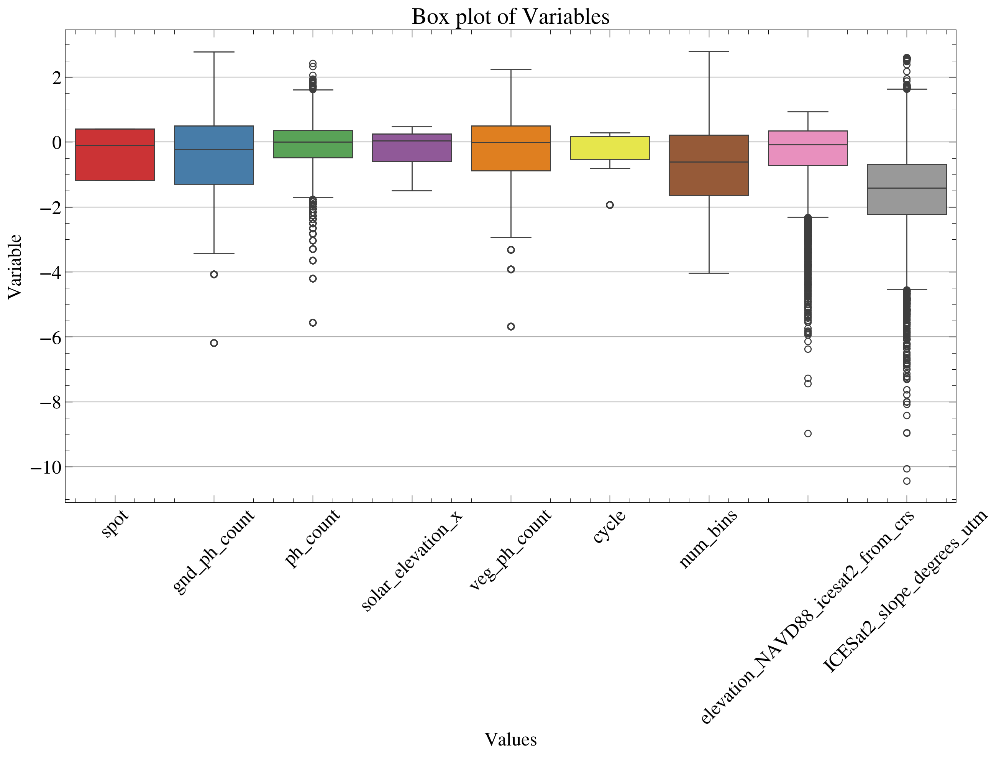

In [9]:
plt.figure(figsize = (15,8))
# sns.boxplot(data = eda_data, palette="Set1")
sns.boxplot(data = np.log(eda_data), palette="Set1")
plt.xlabel("Values")
plt.ylabel("Variable")
plt.xticks(rotation = 45)
plt.title("Box plot of Variables")
plt.show()

### Pair Plot

In [1]:
# # sns.pairplot(eda_data, diag_kind='kde')
# sns.pairplot(icesat2_data, diag_kind='kde')
# plt.tick_params(axis="both", direction="in", length=8, which = "both", 
#                 labelsize=12, top = True, right = True, rotation = 45)
# plt.xlabel(" ", fontsize=20)
# plt.xticks(rotation = 90)
# plt.show()

## Monte Carlo Dropout 

The code in this notebook is a step‐by‐step PyTorch demonstration of how to implement Monte Carlo (MC) dropout as an ensemble method.

###  Define Model Architecture: a Neural Network with Dropout
We include dropout layers that will be active during both training and MC inference. During training, **dropout** is a **regularization technique**. During inference, dropout is an ensemble technique.

In [11]:
class MCDropoutNet(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, dropout_rate=0.5):
        super(MCDropoutNet, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.dropout = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc3 = nn.Linear(hidden_dim, output_dim)
        
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = self.dropout(x)  # Dropout layer
        x = F.relu(self.fc2(x))
        x = self.dropout(x)  # Dropout layer
        output = self.fc3(x)
        return output

#### With Batch Size and Validation Set

Epoch [10/170], Validation Loss: 0.1552
Epoch [20/170], Validation Loss: 0.1450
Epoch [30/170], Validation Loss: 0.1391
Epoch [40/170], Validation Loss: 0.1344
Epoch [50/170], Validation Loss: 0.1331
Epoch [60/170], Validation Loss: 0.1307
Epoch [70/170], Validation Loss: 0.1321
Epoch [80/170], Validation Loss: 0.1293
Epoch [90/170], Validation Loss: 0.1299
Epoch [100/170], Validation Loss: 0.1279
Epoch [110/170], Validation Loss: 0.1306
Epoch [120/170], Validation Loss: 0.1283
Epoch [130/170], Validation Loss: 0.1275
Epoch [140/170], Validation Loss: 0.1283
Epoch [150/170], Validation Loss: 0.1270
Epoch [160/170], Validation Loss: 0.1308
Epoch [170/170], Validation Loss: 0.1284
Training is complete


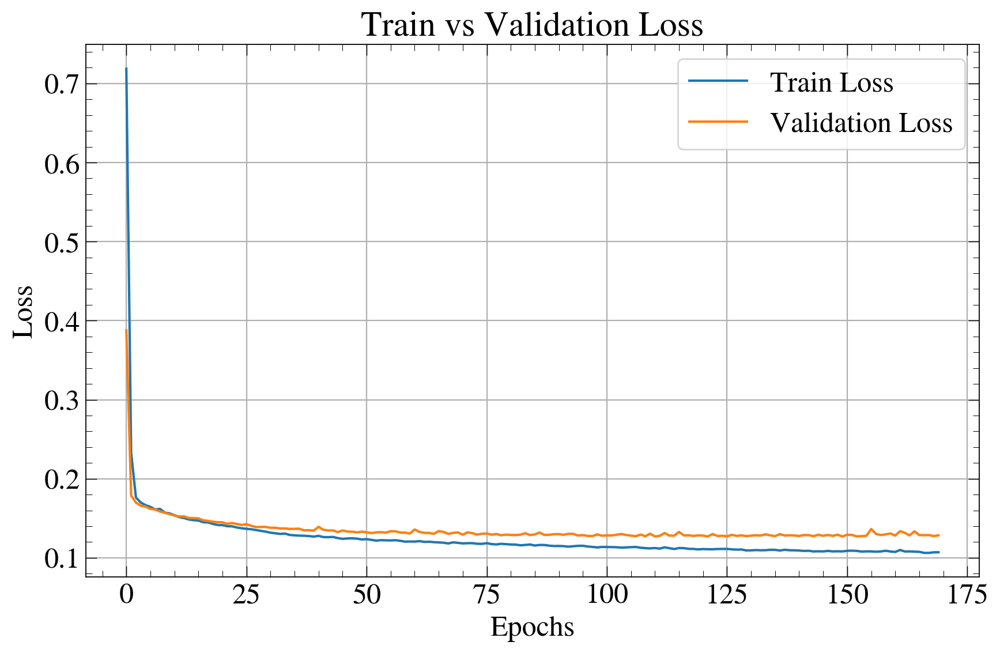

In [14]:
# Model hyperparameters
input_dim = 12
hidden_dim = 48 #32, 64, 128
output_dim = 1
dropout_rate = 0.25 #0.45, 0.25
num_epochs = 170
learning_rate = 1e-3
batch_size = 500
# hidden_dim = 64, dropout_rate = 0.25, learning_rate = 1e-4

# Initialize model, loss, and optimizer
model_mcd = MCDropoutNet(input_dim, hidden_dim, output_dim, dropout_rate)

# Compute the loss (MSELoss for regression)
# criterion = F.mse_loss(outputs, targets)
criterion = nn.MSELoss()
optimizer = optim.Adam(model_mcd.parameters(), lr=learning_rate)

# Convert data to TensorDataset
dataset = TensorDataset(X_train_tensor_0, y_train_tensor_0)

# Split the data into train and validation sets
val_size = int(0.15 * len(dataset))    # use 15% of the training data for validation
train_size = len(dataset) - val_size  # Remaining 85% of the original train data for training

# Use random_split to divide the dataset
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])


# Create DataLoader with the batch size above for train and validation sets. We shuffle for the third time.
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)


# Lists to store loss values
train_losses = []
val_losses = []

# Training loop
model_mcd.train()  # Set the model to training mode and ensure dropout is active during training
for epoch in range(num_epochs):
    train_loss = 0
    for i, (inputs, targets) in enumerate(train_loader):
        train_preds_mcd = model_mcd(inputs)
        loss = criterion(train_preds_mcd, targets)
        # Backpropagation and optimization
        optimizer.zero_grad()
        loss.backward() #
        optimizer.step()
        
        # Accumulate training loss
        train_loss += loss.item()
            
        # # Print the loss every 100 batches 
        # if i % 100 == 0:
        #     print(f"Epoch [{epoch+1}/10], Batch [{i+1}/{len(dataloader)}], Loss: {loss.item()}")

        
    # Average training loss for the epoch
    train_loss /= len(train_loader)
    train_losses.append(train_loss)
        
    # Validate the model after each epoch
    model_mcd.eval()  # Set the model to evaluation mode
    val_loss = 0
    total = 0
    with torch.no_grad():  # No need to track gradients during validation
        for inputs, targets in val_loader:
            val_preds = model_mcd(inputs)
            loss = F.mse_loss(val_preds, targets)
            val_loss += loss.item()
            
    # Print the loss every 100 epochs
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    if (epoch + 1) % 10 == 0:
        print(f"Epoch [{epoch+1}/{num_epochs}], Validation Loss: {val_loss:.4f}")

#     # Print the loss every 100 epochs (optional)
#     if (epoch + 1) % 100 == 0:
#         print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")      
print("Training is complete")

# Plotting the train and validation loss
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.title("Train vs Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

### Monte Carlo Dropout Inference



In [16]:
def mc_dropout_predict(model, x, n_samples=100):
    model.train()  # Activate dropout during inference
    predictions = []
    with torch.no_grad():
        for _ in range(n_samples):
            preds = model(x)
            predictions.append(preds.cpu().numpy())
    predictions = np.array(predictions)  # Shape: (n_samples, batch_size, output_dim)
    return predictions

# Generate predictions with MC dropout
n_samples = 100
predictions_mcd = mc_dropout_predict(model_mcd, X_test_tensor, n_samples)

pred_mean_inv_mcd = []
pred_std_inv_mcd = []
# Compute mean and standard deviation of the inverse predictions to get the actual predictions and standard deviations
for i in range(predictions_mcd.shape[1]):
    pred_avg_mcd = np.mean(scaler_y.inverse_transform(predictions_mcd[:,i]))
    pred_mean_inv_mcd.append(float(pred_avg_mcd))
    
    pred_sd_mcd = np.std(scaler_y.inverse_transform(predictions_mcd[:,i]))
    pred_std_inv_mcd.append(float(pred_sd_mcd))
    
display(np.array(pred_mean_inv_mcd))
display(np.array(pred_std_inv_mcd))

array([4.65538311, 0.09754331, 2.54296684, ..., 4.15114641, 1.3954277 ,
       2.98966694])

array([2.04145622, 1.08666933, 1.20228958, ..., 1.33817947, 0.84439617,
       1.21868217])

In [17]:
# mc_predictions.shape
y_test_copy

array([4.2742434, 0.       , 3.0066223, ..., 5.1692233, 1.2177277,
       2.5601981])

### Visualize the Ensemble Predictions and Uncertainty

We plot the mean prediction along with the uncertainty bands (e.g., ±1 standard deviation).

Uncertainty Estimation: Here we use the mean and standard deviation of the predictions as an estimate of the prediction and its uncertainty, respectively.

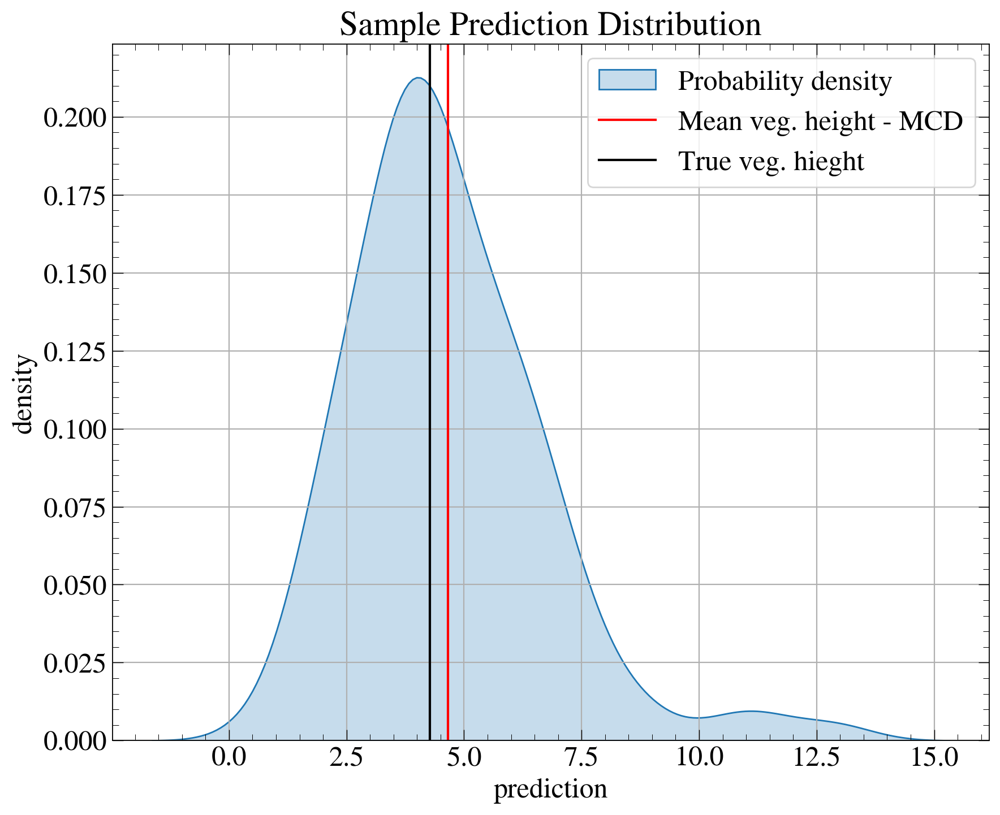

In [19]:
plt.figure(figsize=(10,8))
n = 0
sns.kdeplot(scaler_y.inverse_transform(predictions_mcd[:,n]), shade=True, label = "Probability density")
plt.axvline(pred_mean_inv_mcd[n], color='red', label = "Mean veg. height - MCD")
plt.axvline(y_test_copy[n], color="black", label = "True veg. hieght")
plt.xlabel("prediction")
plt.ylabel("density")
plt.title("Sample Prediction Distribution")
plt.legend()
plt.show()

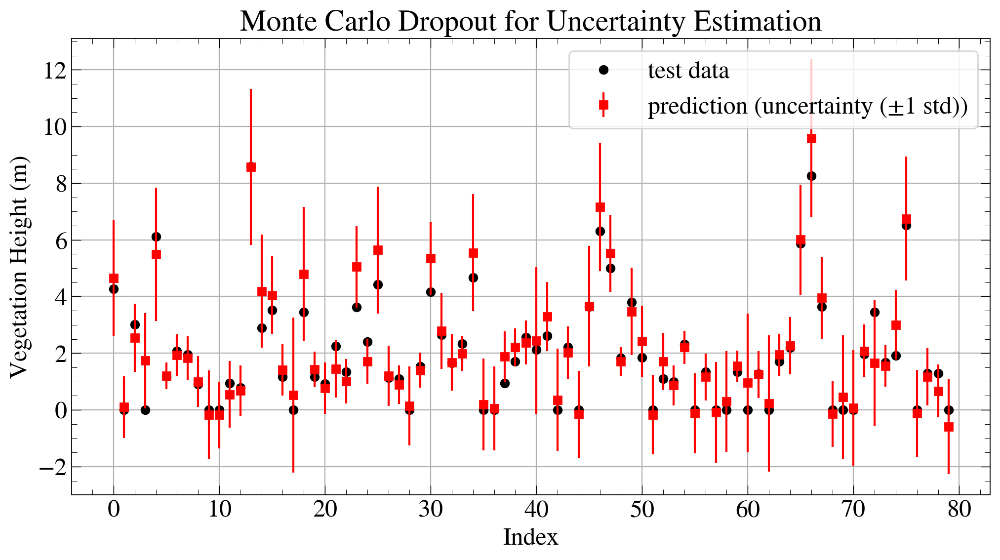

In [20]:
plt.figure(figsize=(12,6))
k = 80
plt.plot(y_test_copy[:k], color="black", label="test data", marker = "o", linestyle="None")
# plt.plot(pred_mean_inv[:50], color="blue", label="MC Dropout Mean", marker = "o", linestyle="None")
plt.errorbar(list(range(k)), 
             pred_mean_inv_mcd[:k], 
             yerr = pred_std_inv_mcd[:k], 
             color="red", alpha=1.0, 
             label="prediction (uncertainty (±1 std))", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
plt.title("Monte Carlo Dropout for Uncertainty Estimation")
plt.show()

#### Overlay Predictions on Map

In [22]:
# Projected CRS
projected_crs = "epsg:6340"  # Horizontal transformation: The EPSG code for NAD83/UTM zone 11N is 26911 (1983) or 6340 (2011).
# Specify region of interest shapefile
shp = "/bsuhome/tnde/geoscience/carbon_estimation/RCEW_shapefile_josh/RCEW_Boundary.shp"
shapefile = gpd.read_file(shp)
shapefile.crs is None
shapefile = shapefile.to_crs(projected_crs)
# shapefile.to_file('/bsuhome/tnde/geoscience/geoscience/carbon_estimation/RCEW_shapefile_josh/RCEW_Boundary.geojson', driver='GeoJSON')

# Specify region of interest from geojson
poly_fn = '/bsuhome/tnde/geoscience/carbon_estimation/RCEW_shapefile_josh/RCEW_Boundary.geojson'
pregion = gpd.read_file(poly_fn)
pregion = pregion.to_crs(projected_crs)
region = sliderule.toregion(poly_fn)["poly"] # symplify 

# Prepare coordinate lists for plotting the region of interest polygon
region_lon = [e["lon"] for e in region]
region_lat = [e["lat"] for e in region]

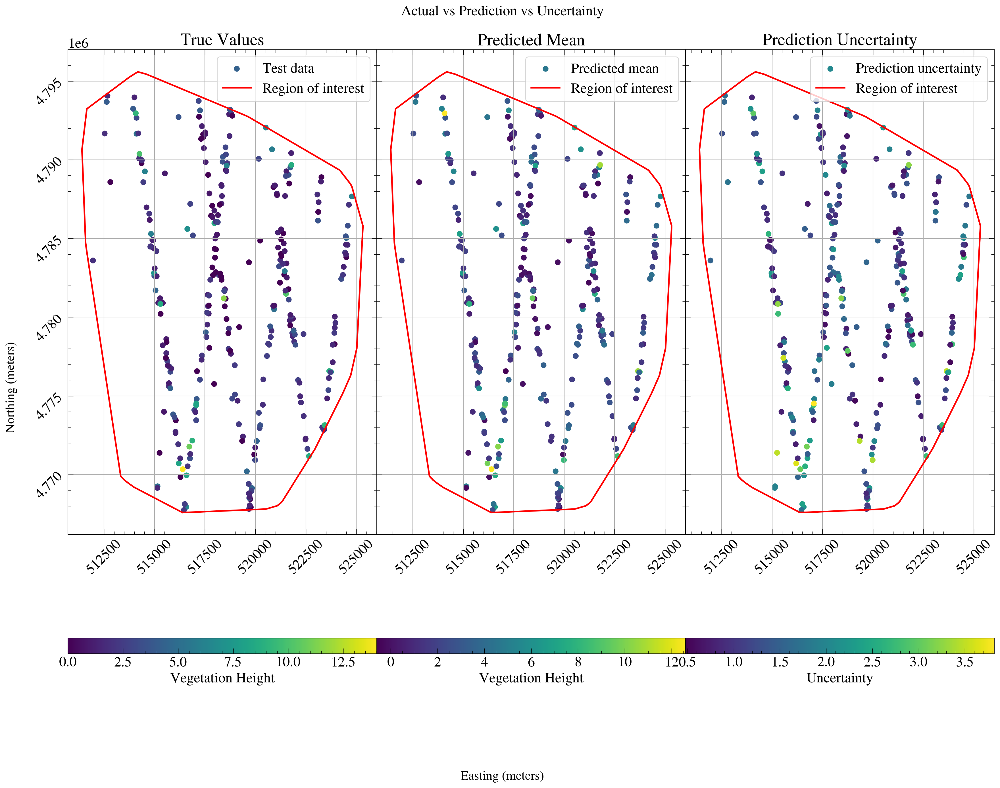

In [23]:
# Prepare the data (ensure X_test_copy, y_test_copy, pred_mean_inv_de, pred_std_inv_de are defined)
k = 300
# Create 3 subplots in one figure (1 row, 3 columns)
fig, ax = plt.subplots(1, 3, figsize=(18, 14), sharey=True)  # 1 row, 3 columns

# Plot the first scatter plot on the first axis (ax[0])
scatter1 = ax[0].scatter(X_test_copy[:, 8][:k], X_test_copy[:, 9][:k],
                          c=y_test_copy[:k], cmap="viridis", s=40, alpha=1.0, label="Test data")
ax[0].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar1 = plt.colorbar(scatter1, ax=ax[0], orientation="horizontal")
cbar1.set_label("Vegetation Height")
ax[0].set_title("True Values")
# ax[0].set_xlabel("Easting (meters)")
# ax[0].set_ylabel("Northing (meters)")
ax[0].legend()

# Plot the second scatter plot on the second axis (ax[1])
scatter2 = ax[1].scatter(X_test_copy[:, 8][:k], X_test_copy[:, 9][:k],
                          c=np.array(pred_mean_inv_mcd)[:k], cmap="viridis", s=40, alpha=1.0, label="Predicted mean")
ax[1].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar2 = plt.colorbar(scatter2, ax=ax[1], orientation="horizontal")
cbar2.set_label("Vegetation Height")
ax[1].set_title("Predicted Mean")
# ax[1].set_xlabel("Easting (meters)")
# ax[1].set_ylabel("Northing (meters)")
ax[1].legend()

# Plot the third scatter plot on the third axis (ax[2])
scatter3 = ax[2].scatter(X_test_copy[:, 8][:k], X_test_copy[:, 9][:k],
                          c=np.array(pred_std_inv_mcd)[:k], cmap="viridis", s=40, alpha=1.0, label="Prediction uncertainty")
ax[2].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar3 = plt.colorbar(scatter3, ax=ax[2], orientation="horizontal")
cbar3.set_label("Uncertainty")
ax[2].set_title("Prediction Uncertainty")
# ax[2].set_xlabel("Easting (meters)")
# ax[2].set_ylabel("Northing (meters)")
ax[2].legend()

# Super labels
fig.supxlabel(r"Easting (meters)", va="center", ha="center", fontsize=16)
fig.supylabel(r"Northing (meters)", va="center", ha="center", fontsize=16)
# Add a super title for the entire figure
plt.suptitle("Actual vs Prediction vs Uncertainty", fontsize=18)


# Rotate x-axis tick labels for all subplots
for axis in ax:
    plt.sca(axis)  # Set current axis
    plt.xticks(rotation=45)  # Rotate x-tick labels
    plt.yticks(rotation=45)  # Rotate y-tick labels

# Adjust layout
plt.tight_layout(h_pad = -1.0, w_pad = -0.3)
plt.show()

## Deep Ensembles

### Define Model Architecture: a Simple Neural Network

We define a simple feed-forward network for a regression task. Each model in the ensemble will have the same architecture but will be independently initialized and trained.

In [24]:
class SimpleNet(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(SimpleNet, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        # self.dropout1 = nn.Dropout(0.5)  # Dropout for regularization
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        # self.dropout2 = nn.Dropout(0.5)  # Dropout for regularization
        self.fc3 = nn.Linear(hidden_dim, hidden_dim)
        # self.dropout3 = nn.Dropout(0.5)  # Dropout for regularization
        self.fc4 = nn.Linear(hidden_dim, output_dim)
    
    def forward(self, x):
        x = torch.relu(self.fc1(x))
        # x = self.dropout1(x)  # Dropout
        x = torch.relu(self.fc2(x))
        # x = self.dropout2(x)  # Dropout
        x = torch.relu(self.fc3(x))
        # x = self.dropout3(x)  # Dropout
        x = self.fc4(x)
        return x

#### With Batch Size and Validation Set

Training model 10/30...
Training model 20/30...
Training model 30/30...


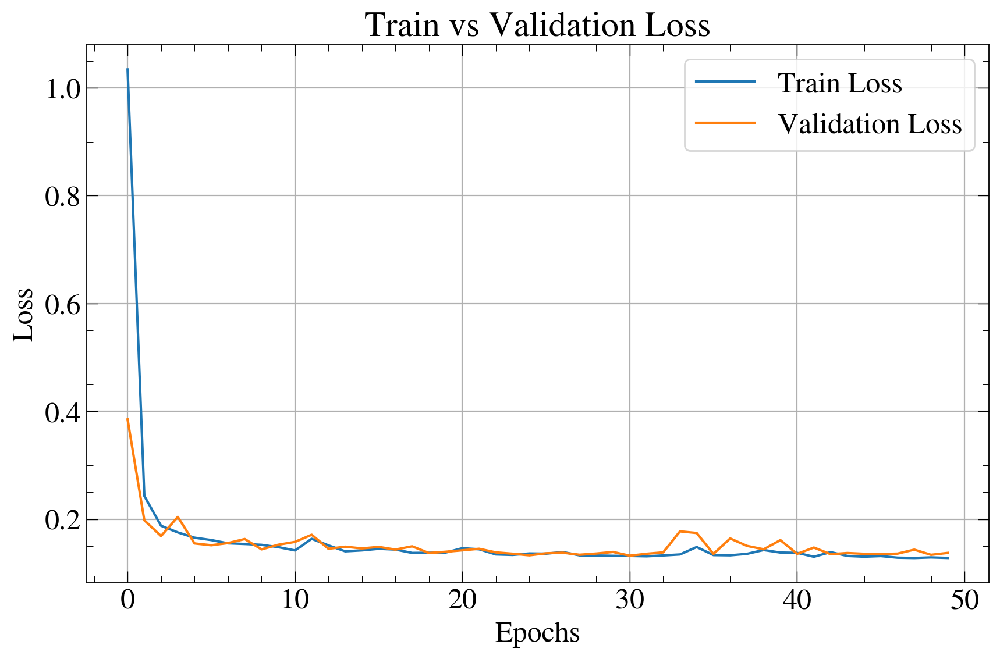

In [27]:
def train_model(model, x_train, y_train, x_val, y_val, num_epochs=500, learning_rate=0.01, batch_size=500):
    # Create DataLoader for batching
    train_dataset = TensorDataset(x_train, y_train)
    val_dataset = TensorDataset(x_val, y_val)
    train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    model.train()

    # Lists to store losses for plotting
    train_losses = []
    val_losses = []
    
    for epoch in range(num_epochs):
        # Training phase
        train_loss = 0
        for batch_idx, (inputs, targets) in enumerate(train_dataloader):
            optimizer.zero_grad()
            predictions = model(inputs)
            loss = criterion(predictions, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        
        # Calculate the average training loss for the epoch
        train_loss /= len(train_dataloader)
        train_losses.append(train_loss)

        # Validation phase
        model.eval()  # Set the model to evaluation mode
        val_loss = 0
        with torch.no_grad():
            for inputs, targets in val_dataloader:
                predictions = model(inputs)
                loss = criterion(predictions, targets)
                val_loss += loss.item()
        
        # Calculate the average validation loss for the epoch
        val_loss /= len(val_dataloader)
        val_losses.append(val_loss)

        # # Print the loss for every 10th epoch (for feedback)
        # if (epoch + 1) % 10 == 0:
        #     print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

    return model, train_losses, val_losses

# Ensemble hyperparameters
ensemble_size = 30
input_dim = 12
hidden_dim = 32 #32, 64, 128
output_dim = 1
num_epochs = 50
learning_rate = 1e-1
batch_size = 1000  # 100  Set batch size

# Split the data into 85% training and 15% validation
X_train_tensor, X_val_tensor, y_train_tensor, y_val_tensor = train_test_split(X_train_tensor_0, y_train_tensor_0, test_size=0.15, random_state=42)

# Train ensemble of models
ensemble_models = []
for i in range(ensemble_size):
    model_de = SimpleNet(input_dim, hidden_dim, output_dim)
    if (i + 1) % 10 == 0:
        print(f"Training model {i+1}/{ensemble_size}...")
    model_de, train_losses, val_losses = train_model(model_de, X_train_tensor, y_train_tensor, X_val_tensor, y_val_tensor, num_epochs, learning_rate, batch_size)
    ensemble_models.append(model_de)
    
    # Plot the loss curves for the last model
    if (i + 1) == ensemble_size:
        plt.figure(figsize=(10, 6))
        plt.plot(train_losses, label="Train Loss")
        plt.plot(val_losses, label="Validation Loss")
        plt.title("Train vs Validation Loss")
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid(True)
        plt.show()

### Inference with Deep Ensembles

During inference, each model in the ensemble produces its own prediction. The final prediction is obtained by averaging the predictions, and the variability across predictions provides a measure of uncertainty.

In [29]:
def ensemble_predict(models, x):
    preds = []
    for model in models:
        model.eval()  # Set each model to evaluation mode
        with torch.no_grad():
            pred = model(x)
            preds.append(pred.cpu().numpy())
    preds = np.array(preds)  # Shape: (ensemble_size, batch_size, output_dim)
    return preds

# Get ensemble predictions
ensemble_preds = ensemble_predict(ensemble_models, X_test_tensor)

pred_mean_inv_de = []
pred_std_inv_de = []
# Compute mean and standard deviation of the inverse predictions to get the actual predictions and standard deviations
for i in range(ensemble_preds.shape[1]):
    pred_avg_de = np.mean(scaler_y.inverse_transform(ensemble_preds[:,i]))
    pred_mean_inv_de.append(float(pred_avg_de))
    
    pred_sd_de = np.std(scaler_y.inverse_transform(ensemble_preds[:,i]))
    pred_std_inv_de.append(float(pred_sd_de))
    
display(np.array(pred_mean_inv_de))
display(np.array(pred_std_inv_de))
y_test_copy

array([3.54986501, 0.16170028, 2.3754251 , ..., 3.73858857, 1.26497543,
       2.48497391])

array([0.32684481, 0.19019544, 0.21511585, ..., 0.30585995, 0.12452402,
       0.19021007])

array([4.2742434, 0.       , 3.0066223, ..., 5.1692233, 1.2177277,
       2.5601981])

### Visualize the Results
Finally, we plot the ensemble’s mean prediction along with uncertainty bands (e.g., ±1 standard deviation).

Uncertainty Estimation: Here we use the mean and standard deviation of the predictions as an estimate of the prediction and its uncertainty, respectively.

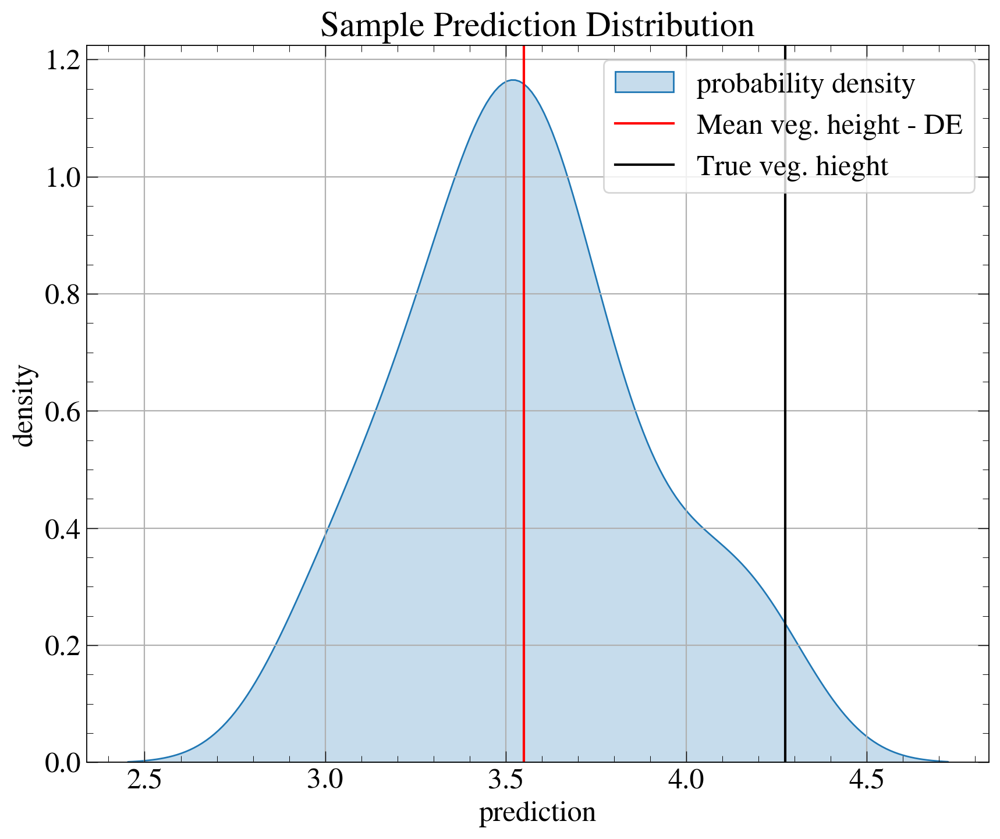

In [31]:
plt.figure(figsize=(10,8))
n = 0
sns.kdeplot(scaler_y.inverse_transform(ensemble_preds[:,n]), shade=True, label = "probability density")
plt.axvline(pred_mean_inv_de[n], color='red', label = "Mean veg. height - DE")
plt.axvline(y_test_copy[n], color="black", label = "True veg. hieght")
plt.xlabel("prediction")
plt.ylabel("density")
plt.title("Sample Prediction Distribution")
plt.legend()
plt.show()

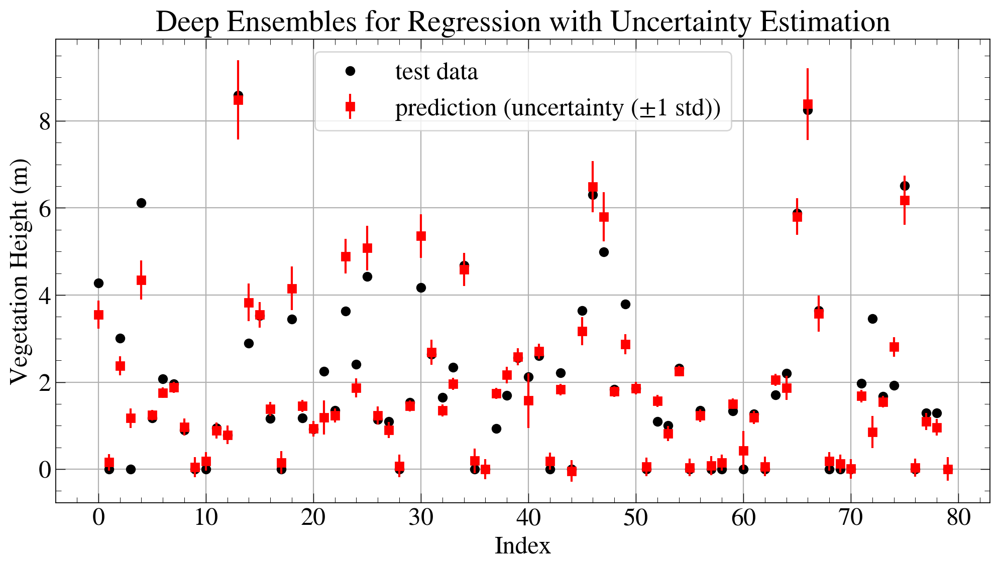

In [32]:
plt.figure(figsize=(12,6))
k = 80
plt.plot(y_test_copy[:k], color="black", label="test data", marker = "o", linestyle="None")
# plt.plot(pred_mean_inv[:50], color="blue", label="MC Dropout Mean", marker = "o", linestyle="None")
plt.errorbar(list(range(k)), 
             pred_mean_inv_de[:k], 
             yerr = pred_std_inv_de[:k], 
             color="red", alpha=1.0, 
             label="prediction (uncertainty (±1 std))", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
plt.title("Deep Ensembles for Regression with Uncertainty Estimation")
plt.show()

#### Overlay Predictions on Map

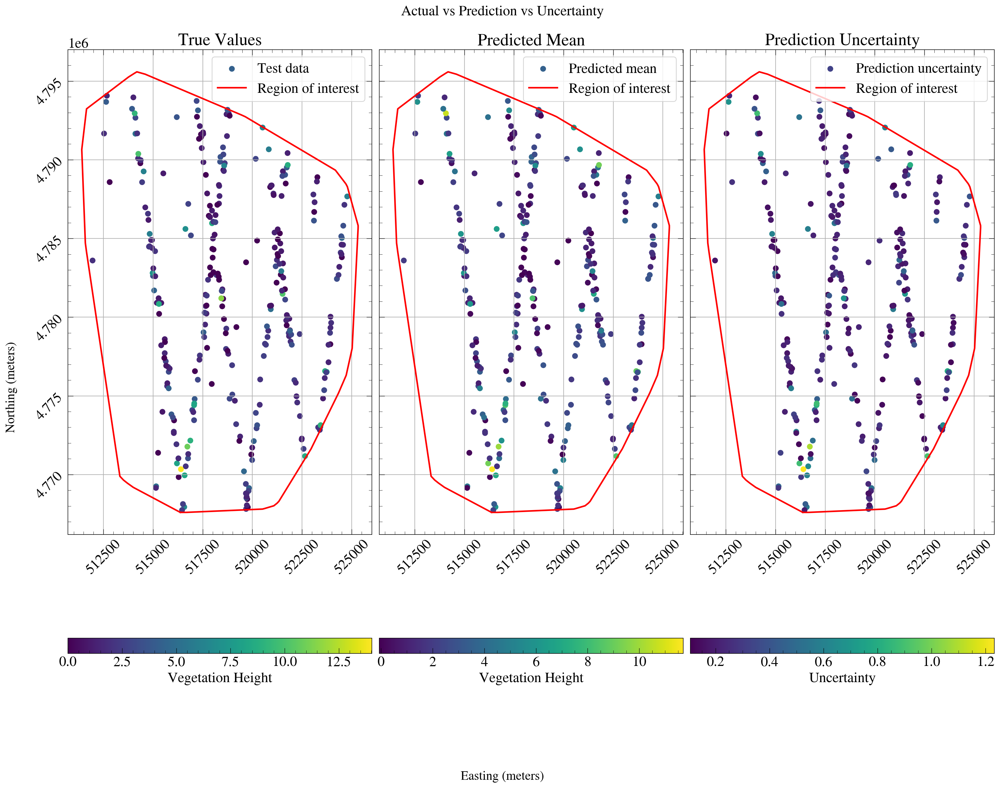

In [35]:
# Prepare the data (ensure X_test_copy, y_test_copy, pred_mean_inv_de, pred_std_inv_de are defined)
k = 300
# Create 3 subplots in one figure (1 row, 3 columns)
fig, ax = plt.subplots(1, 3, figsize=(18, 14), sharey=True)  # 1 row, 3 columns

# Plot the first scatter plot on the first axis (ax[0])
scatter1 = ax[0].scatter(X_test_copy[:, 8][:k], X_test_copy[:, 9][:k],
                          c=y_test_copy[:k], cmap="viridis", s=40, alpha=1.0, label="Test data")
ax[0].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar1 = plt.colorbar(scatter1, ax=ax[0], orientation="horizontal")
cbar1.set_label("Vegetation Height")
ax[0].set_title("True Values")
# ax[0].set_xlabel("Easting (meters)")
# ax[0].set_ylabel("Northing (meters)")
ax[0].legend()

# Plot the second scatter plot on the second axis (ax[1])
scatter2 = ax[1].scatter(X_test_copy[:, 8][:k], X_test_copy[:, 9][:k],
                          c=np.array(pred_mean_inv_de)[:k], cmap="viridis", s=40, alpha=1.0, label="Predicted mean")
ax[1].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar2 = plt.colorbar(scatter2, ax=ax[1], orientation="horizontal")
cbar2.set_label("Vegetation Height")
ax[1].set_title("Predicted Mean")
# ax[1].set_xlabel("Easting (meters)")
# ax[1].set_ylabel("Northing (meters)")
ax[1].legend()

# Plot the third scatter plot on the third axis (ax[2])
scatter3 = ax[2].scatter(X_test_copy[:, 8][:k], X_test_copy[:, 9][:k],
                          c=np.array(pred_std_inv_de)[:k], cmap="viridis", s=40, alpha=1.0, label="Prediction uncertainty")
ax[2].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar3 = plt.colorbar(scatter3, ax=ax[2], orientation="horizontal")
cbar3.set_label("Uncertainty")
ax[2].set_title("Prediction Uncertainty")
# ax[2].set_xlabel("Easting (meters)")
# ax[2].set_ylabel("Northing (meters)")
ax[2].legend()

# Super labels
fig.supxlabel(r"Easting (meters)", va="center", ha="center", fontsize=16)
fig.supylabel(r"Northing (meters)", va="center", ha="center", fontsize=16)
# Add a super title for the entire figure
plt.suptitle("Actual vs Prediction vs Uncertainty", fontsize=18)


# Rotate x-axis tick labels for all subplots
for axis in ax:
    plt.sca(axis)  # Set current axis
    plt.xticks(rotation=45)  # Rotate x-tick labels
    plt.yticks(rotation=45)  # Rotate y-tick labels

# Adjust layout
plt.tight_layout(h_pad = -1.0, w_pad = -0.3)
plt.show()

## AutoDEUQ - DeepHyper Uncertainty Quantification.

In [39]:
WIDTH_PLOTS = 8
HEIGHT_PLOTS = WIDTH_PLOTS / 1.618

In [40]:
# is_gpu_available = torch.cuda.is_available()
# n_gpus = torch.cuda.device_count()

### Configurable Neural Network with Uncertainty

In [41]:
class DeepNormalRegressor(nn.Module):
    def __init__(
        self,
        n_inputs,
        layers,
        n_units_mean=64,
        n_units_std=64,
        # std_offset=1e-3,
        std_offset=0.0,
        # softplus_factor=1e-3,
        softplus_factor=1.0,
        loc=0,
        scale=1.0,
    ):
        super().__init__()

        layers_ = []
        prev_n_units = n_inputs
        for n_units, activation, dropout_rate in layers:
            linear_layer = nn.Linear(prev_n_units, n_units)
            if activation == "relu":
                activation_layer = nn.ReLU()
            elif activation == "leaky_relu":
                activation_layer = nn.LeakyReLU()
            elif activation == "sigmoid":
                activation_layer = nn.Sigmoid()
            elif activation == "tanh":
                activation_layer = nn.Tanh()
            elif activation == "swish":
                activation_layer = nn.SiLU()
            elif activation == "mish":
                activation_layer = nn.Mish()
            elif activation == "gelu":
                activation_layer = nn.GELU()
            elif activation == "silu":
                activation_layer = nn.SiLU()
            dropout_layer = nn.Dropout(dropout_rate)

            layers_.extend([linear_layer, activation_layer, dropout_layer])

            prev_n_units = n_units

        # Shared parameters
        self.shared_layer = nn.Sequential(
            *layers_,
        )

        # Mean parameters
        self.mean_layer = nn.Sequential(
            nn.Linear(prev_n_units, n_units_mean),
            # nn.ReLU(),
            nn.LeakyReLU(),
            nn.Linear(n_units_mean, 1),
        )

        # Standard deviation parameters
        self.std_layer = nn.Sequential(
            nn.Linear(prev_n_units, n_units_std),
            # nn.ReLU(),
            nn.LeakyReLU(),
            nn.Linear(n_units_std, 1),
            # nn.Softplus(beta=1.0, threshold=20.0),  # enforces positivity
            nn.Softplus(beta=1.0, threshold=10.0),  # enforces positivity
        )

        self.std_offset = std_offset
        self.softplus_factor = softplus_factor
        self.loc = loc
        self.scale = scale

    def forward(self, x):
        # Shared embedding
        shared = self.shared_layer(x)

        # Parametrization of the mean
        mu = self.mean_layer(shared) + self.loc

        # Parametrization of the standard deviation
        sigma = self.std_offset + self.std_layer(self.softplus_factor * shared) * self.scale
        
        # mu, sigma = scaler_y.inverse_transform(mu), scaler_y.inverse_transform(sigma)
        return torch.distributions.Normal(mu, sigma)

### Hyperparameter Search Space

In [42]:
from ConfigSpace import GreaterThanCondition
from deephyper.hpo import HpProblem

def create_hpo_problem(min_num_layers=3, max_num_layers=8, max_num_units=512):
    problem = HpProblem()

    # Neural Architecture Hyperparameters
    num_layers = problem.add_hyperparameter((min_num_layers, max_num_layers), "num_layers", default_value=5)

    conditions = []
    for i in range(max_num_layers):

        # Adding the hyperparameters that impact each layer of the model
        layer_i_units = problem.add_hyperparameter((64, max_num_units), f"layer_{i}_units", default_value=max_num_units)
        layer_i_activation = problem.add_hyperparameter(
            ["relu", "leaky_relu", "sigmoid", "tanh", "swish", "mish", "gelu", "silu"],
            f"layer_{i}_activation",
            default_value="leaky_relu",
        )
        layer_i_dropout_rate = problem.add_hyperparameter(
            (0.0, 0.5), f"layer_{i}_dropout_rate", default_value=0.0
        )

        # Adding the constraints to define when these hyperparameters are active
        if i + 1 > min_num_layers:
            conditions.extend(
                [
                    GreaterThanCondition(layer_i_units, num_layers, i),
                    GreaterThanCondition(layer_i_activation, num_layers, i),
                    GreaterThanCondition(layer_i_dropout_rate, num_layers, i),
                ]
            )

    problem.add_conditions(conditions)

    # Hyperparameters of the output layers
    problem.add_hyperparameter((64, max_num_units), "n_units_mean", default_value=max_num_units)
    problem.add_hyperparameter((64, max_num_units), "n_units_std", default_value=max_num_units)
    problem.add_hyperparameter((1e-5, 1e-1, "log-uniform"), "std_offset", default_value=1e-3)
    problem.add_hyperparameter((0.1, 10), "softplus_factor", default_value=1)

    # Training Hyperparameters
    problem.add_hyperparameter((1e-5, 1e-1, "log-uniform"), "learning_rate", default_value=1e-3)
    problem.add_hyperparameter((200, 1500, "log-uniform"), "batch_size", default_value=500)
    problem.add_hyperparameter((0.01, 0.99), "lr_scheduler_factor", default_value=0.1)
    problem.add_hyperparameter((5, 20), "lr_scheduler_patience", default_value=10)

    return problem

problem = create_hpo_problem()
problem

Configuration space object:
  Hyperparameters:
    batch_size, Type: UniformInteger, Range: [200, 1500], Default: 500, on log-scale
    layer_0_activation, Type: Categorical, Choices: {relu, leaky_relu, sigmoid, tanh, swish, mish, gelu, silu}, Default: leaky_relu
    layer_0_dropout_rate, Type: UniformFloat, Range: [0.0, 0.5], Default: 0.0
    layer_0_units, Type: UniformInteger, Range: [64, 512], Default: 512
    layer_1_activation, Type: Categorical, Choices: {relu, leaky_relu, sigmoid, tanh, swish, mish, gelu, silu}, Default: leaky_relu
    layer_1_dropout_rate, Type: UniformFloat, Range: [0.0, 0.5], Default: 0.0
    layer_1_units, Type: UniformInteger, Range: [64, 512], Default: 512
    layer_2_activation, Type: Categorical, Choices: {relu, leaky_relu, sigmoid, tanh, swish, mish, gelu, silu}, Default: leaky_relu
    layer_2_dropout_rate, Type: UniformFloat, Range: [0.0, 0.5], Default: 0.0
    layer_2_units, Type: UniformInteger, Range: [64, 512], Default: 512
    layer_3_activation

### Loss and Metric

In [43]:
def nll(y, rv_y):
    """Negative log likelihood for Pytorch distribution.

    Args:
        y: true data.
        rv_y: learned (predicted) probability distribution.
    """
    return -rv_y.log_prob(y)


def squared_error(y_true, rv_y):
    """Squared error for Pytorch distribution.

    Args:
        y: true data.
        rv_y: learned (predicted) probability distribution.
    """
    y_pred = rv_y.mean
    return (y_true - y_pred) ** 2

### Training Loop

In [44]:
def train_one_step(model, optimizer, x_batch, y_batch):
    model.train()
    optimizer.zero_grad()
    y_dist = model(x_batch)

    loss = torch.mean(nll(y_batch, y_dist))
    mse = torch.mean(squared_error(y_batch, y_dist))

    loss.backward()
    optimizer.step()

    return loss, mse

def train(
    job,
    model,
    optimizer,
    x_train,
    x_val,
    y_train,
    y_val,
    n_epochs,
    batch_size,
    scheduler=None,
    # patience=200,
    patience=10,
    progressbar=True,
):
    data_train = DataLoader(TensorDataset(x_train, y_train), batch_size=batch_size, shuffle=True)

    checkpointed_state_dict = model.state_dict()
    checkpointed_val_loss = np.inf

    train_loss, val_loss = [], []
    train_mse, val_mse = [], []

    tqdm_bar = tqdm(total=n_epochs, disable=not progressbar)

    for epoch in range(n_epochs):
        batch_losses_t, batch_losses_v, batch_mse_t, batch_mse_v = [], [], [], []

        for batch_x, batch_y in data_train:
            b_train_loss, b_train_mse = train_one_step(model, optimizer, batch_x, batch_y)

            model.eval()
            y_dist = model(x_val)
            b_val_loss = torch.mean(nll(y_val, y_dist))
            b_val_mse = torch.mean(squared_error(y_val, y_dist))

            batch_losses_t.append(to_numpy(b_train_loss))
            batch_mse_t.append(to_numpy(b_train_mse))
            batch_losses_v.append(to_numpy(b_val_loss))
            batch_mse_v.append(to_numpy(b_val_mse))

        train_loss.append(np.mean(batch_losses_t))
        val_loss.append(np.mean(batch_losses_v))
        train_mse.append(np.mean(batch_mse_t))
        val_mse.append(np.mean(batch_mse_v))

        if scheduler is not None:
            scheduler.step(val_loss[-1])

        tqdm_bar.update(1)
        tqdm_bar.set_postfix(
            {
                "train_loss": f"{train_loss[-1]:.3f}",
                "val_loss": f"{val_loss[-1]:.3f}",
                "train_mse": f"{train_mse[-1]:.3f}",
                "val_mse": f"{val_mse[-1]:.3f}",
            }
        )

        # Checkpoint weights if they improve
        if val_loss[-1] < checkpointed_val_loss:
            checkpointed_val_loss = val_loss[-1]
            checkpointed_state_dict = model.state_dict()

        # Early discarding
        job.record(budget=epoch+1, objective=-val_loss[-1])
        if job.stopped():
            break

        if len(val_loss) > (patience + 1) and val_loss[-patience - 1] < min(val_loss[-patience:]):
            break

    # Reload the best weights
    model.load_state_dict(checkpointed_state_dict)

    return train_loss, val_loss, train_mse, val_mse

### Run Time

In [45]:
dtype = torch.float32
if torch.cuda.is_available():
    device = "cuda"
    device_count = 1
else:
    device = "cpu"
    device_count = multiprocessing.cpu_count()

print(f"Runtime with {device=}, {device_count=}, {dtype=}")

Runtime with device='cpu', device_count=48, dtype=torch.float32


### Conversion Utility Functions

In [46]:
def to_torch(array):
    return torch.from_numpy(array).to(device=device, dtype=dtype)

def to_numpy(tensor):
    return tensor.detach().cpu().numpy()

### Evaluation Function

In [47]:
num_predictors = X_train_tensor_0.shape[1]
def create_model(parameters: dict, y_mu=0, y_std=1.0):
    num_layers = parameters["num_layers"]
    torch_module = DeepNormalRegressor(
        n_inputs=num_predictors,
        layers=[
            (
                parameters[f"layer_{i}_units"],
                parameters[f"layer_{i}_activation"],
                parameters[f"layer_{i}_dropout_rate"],
            )
            for i in range(num_layers)
        ],
        n_units_mean=parameters["n_units_mean"],
        n_units_std=parameters["n_units_std"],
        std_offset=parameters["std_offset"],
        softplus_factor=parameters["softplus_factor"],
        loc=y_mu,
        scale=y_std,
    ).to(device=device, dtype=dtype)
    return torch_module

In [48]:
# Split the data into 85% training and 15% validation
X_train_tensor, X_val_tensor, y_train_tensor, y_val_tensor = train_test_split(X_train_tensor_0, y_train_tensor_0, test_size=0.15, random_state=42)
y_mu, y_std = np.mean(np.array(y_train_tensor)), np.std(np.array(y_train_tensor))

# max_n_epochs = 1_000
max_n_epochs = 150

def run(job, model_checkpoint_dir=".", verbose=False):
    (x, y) = (X_train_tensor, y_train_tensor) # training data
    (vx, vy) = (X_val_tensor, y_val_tensor) # validation data
    (tx, ty) = (X_test_tensor, y_test_tensor) # test data

    # Create the model based on neural architecture hyperparameters
    model = create_model(job.parameters, y_mu, y_std)
    # model = create_model(job.parameters)

    if verbose:
        print(model)

    # Initialize training loop based on training hyperparameters
    optimizer = torch.optim.Adam(model.parameters(), lr=job.parameters["learning_rate"])
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        factor=job.parameters["lr_scheduler_factor"],
        patience=job.parameters["lr_scheduler_patience"],
    )

    # x, vx, tx = to_torch(x), to_torch(vx), to_torch(tx)
    # y, vy, ty = to_torch(y), to_torch(vy), to_torch(ty)

    try:
        train_losses, val_losses, train_mse, val_mse = train(
            job,
            model,
            optimizer,
            x,
            vx,
            y,
            vy,
            n_epochs=max_n_epochs,
            batch_size=job.parameters["batch_size"],
            scheduler=scheduler,
            progressbar=verbose,
        )
    except Exception:
        return "F_fit"

    ty_pred = model(tx)
    test_loss = to_numpy(torch.mean(nll(ty, ty_pred)))
    test_mse = to_numpy(torch.mean(squared_error(ty, ty_pred)))

    # Saving the model's state (i.e., weights)
    torch.save(model.state_dict(), os.path.join(model_checkpoint_dir, f"model_{job.id}.pt"))

    return {
        "objective": -val_losses[-1],
        "metadata": {
            "train_loss": train_losses,
            "val_loss": val_losses,
            "train_mse": train_mse,
            "val_mse": val_mse,
            "test_loss": test_loss,
            "test_mse": test_mse,
            "budget": len(val_losses),
        },
    }

### Evaluation of the Baseline

In [49]:
from deephyper.evaluator import RunningJob

baseline_dir = "nas_baseline_regression_icesat2_h_mean_canopy2_final"

# # Check and delete if directory path exists
# baseline_path = os.path.join(os.getcwd(), baseline_dir)
# if os.path.isdir(baseline_path):
#     shutil.rmtree(baseline_path)
#     print(f"Deleted directory: {baseline_path}")
# else:
#     print("Directory does not exist")
#     pass  

def evaluate_baseline(problem):    
    model_checkpoint_dir = os.path.join(baseline_dir, "models")
    pathlib.Path(model_checkpoint_dir).mkdir(parents=True, exist_ok=True)

    default_parameters = problem.default_configuration
    print(f"{default_parameters=}\n")

    result = run(
        RunningJob(parameters=default_parameters),
        model_checkpoint_dir=model_checkpoint_dir,
        verbose=True,
    )
    return result

baseline_results = evaluate_baseline(problem)

default_parameters={'batch_size': 500, 'layer_0_activation': 'leaky_relu', 'layer_0_dropout_rate': 0.0, 'layer_0_units': 512, 'layer_1_activation': 'leaky_relu', 'layer_1_dropout_rate': 0.0, 'layer_1_units': 512, 'layer_2_activation': 'leaky_relu', 'layer_2_dropout_rate': 0.0, 'layer_2_units': 512, 'learning_rate': 0.001, 'lr_scheduler_factor': 0.1, 'lr_scheduler_patience': 10, 'n_units_mean': 512, 'n_units_std': 512, 'num_layers': 5, 'softplus_factor': 1.0, 'std_offset': 0.001, 'layer_3_activation': 'leaky_relu', 'layer_3_dropout_rate': 0.0, 'layer_3_units': 512, 'layer_4_activation': 'leaky_relu', 'layer_4_dropout_rate': 0.0, 'layer_4_units': 512, 'layer_5_activation': 'relu', 'layer_5_dropout_rate': 0.0, 'layer_5_units': 64, 'layer_6_activation': 'relu', 'layer_6_dropout_rate': 0.0, 'layer_6_units': 64, 'layer_7_activation': 'relu', 'layer_7_dropout_rate': 0.0, 'layer_7_units': 64}

DeepNormalRegressor(
  (shared_layer): Sequential(
    (0): Linear(in_features=12, out_features=512, 

 22%|██▏       | 33/150 [05:25<19:14,  9.87s/it, train_loss=-0.335, val_loss=-0.116, train_mse=0.131, val_mse=0.142]


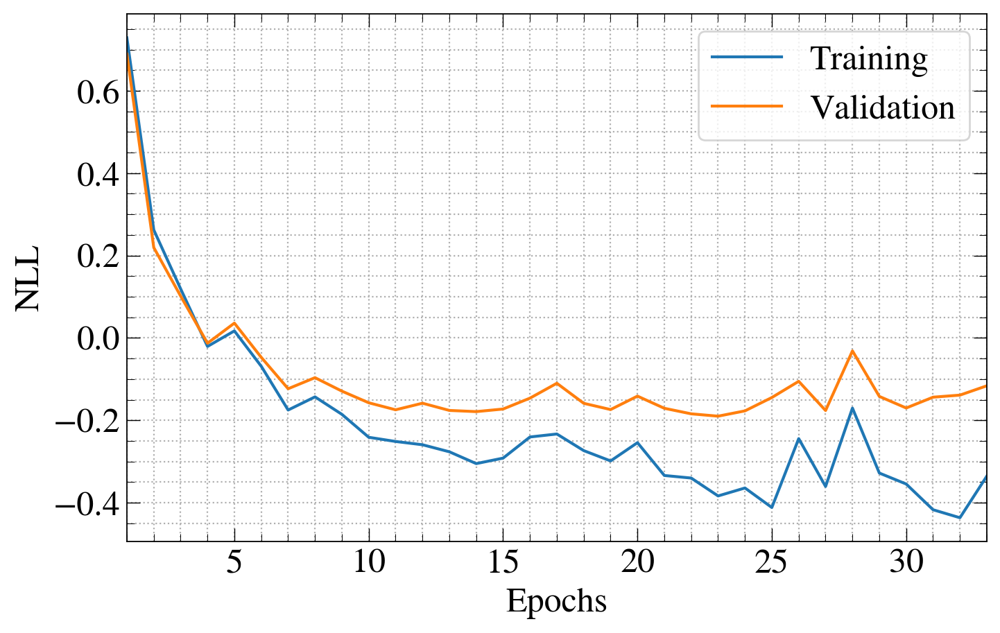

In [50]:
_ = plt.figure(figsize=(WIDTH_PLOTS, HEIGHT_PLOTS))

x_values = np.arange(1, len(baseline_results["metadata"]["train_loss"]) + 1)
_ = plt.plot(
    x_values,
    baseline_results["metadata"]["train_loss"],
    label="Training",
)
_ = plt.plot(
    x_values,
    baseline_results["metadata"]["val_loss"],
    label="Validation",
)

_ = plt.xlim(x_values.min(), x_values.max())
_ = plt.grid(which="both", linestyle=":")
_ = plt.legend()
_ = plt.xlabel("Epochs")
_ = plt.ylabel("NLL")

In [51]:
# baseline_dir = "nas_baseline_regression_icesat2"
weights_path = os.path.join(baseline_dir, "models",  "model_0.0.pt")
parameters = problem.default_configuration
torch_module = create_model(parameters, y_mu, y_std)
# torch_module = create_model(parameters)
torch_module.load_state_dict(torch.load(weights_path, weights_only=True))
torch_module.eval()

y_pred_autodeuq = torch_module.forward(X_test_tensor)
y_pred_mean_autodeuq = to_numpy(y_pred_autodeuq.loc)
y_pred_mean_autodeuq = scaler_y.inverse_transform(y_pred_mean_autodeuq)
y_pred_std_autodeuq = to_numpy(y_pred_autodeuq.scale)
y_pred_std_autodeuq = scaler_y.inverse_transform(y_pred_std_autodeuq)
y_pred_mean_autodeuq

array([[3.4780056 ],
       [0.09219823],
       [2.4606607 ],
       ...,
       [4.3699136 ],
       [1.219101  ],
       [2.4699335 ]], dtype=float32)

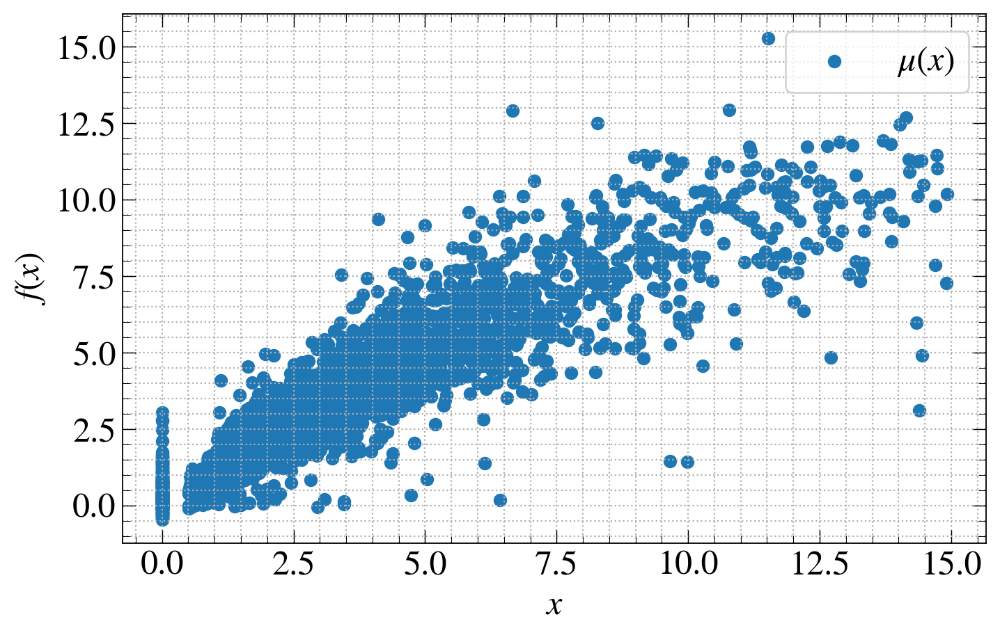

In [52]:
_ = plt.figure(figsize=(WIDTH_PLOTS, HEIGHT_PLOTS))
# _ = plt.scatter(X_train_tensor, y_train_tensor, s=5, label="Training")
# _ = plt.scatter(valid_X, valid_y, s=5, label="Validation")
# _ = plt.plot(test_X, test_y, linestyle="--", color="gray", label="Test")

# _ = plt.scatter(y_test_0, y_pred_mean, label=r"$\mu(x)$")
_ = plt.scatter(y_test_copy, y_pred_mean_autodeuq, label=r"$\mu(x)$")

# _ = plt.fill_between([-30, -15], [-y_lim, -y_lim], [y_lim, y_lim], color="gray", alpha=0.15)
# _ = plt.fill_between([15, 30], [-y_lim, -y_lim], [y_lim, y_lim], color="gray", alpha=0.15)
# _ = plt.xlim(-x_lim, x_lim)
# _ = plt.ylim(-y_lim, y_lim)
_ = plt.legend(ncols=2)
_ = plt.xlabel(r"$x$")
_ = plt.ylabel(r"$f(x)$")
_ = plt.grid(which="both", linestyle=":")

### Neural Architecture Search (NAS) With Bayesian Opimization (BO, a.k.a., Efficient Global Optimization (EGO))

#### Parallel Bayesian Optimization
In DeepHyper, instead of just performing sequential Bayesian optimization we provide asynchronous parallelisation for Bayesian optimization (and other methods). This allows to execute multiple evaluation function in parallel to collect observations of objectives faster. In this code, we will focus on using centralized Bayesian optimization (CBO). In this setting, we have one main process that runs the Bayesian optimization algorithm and we have multiple worker processes that run evaluation functions. 


In [54]:
search_kwargs = {
    "initial_points": [problem.default_configuration],
    "multi_point_strategy": "qUCBd",  # Multi-point strategy for asynchronous batch generations (explained later)
    "acq_optimizer": "mixedga",  # Use continuous Genetic Algorithm for the acquisition function optimizer
    "random_state": 42,  # Random seed
}

In [55]:
from deephyper.evaluator import Evaluator
from deephyper.evaluator.callback import TqdmCallback
from deephyper.hpo import CBO
from deephyper.stopper import MedianStopper

hpo_dir = "nas_regression_icesat2_h_mean_canopy2_final"

def run_neural_architecture_search(problem, max_evals):
    model_checkpoint_dir = os.path.join(hpo_dir, "models")
    pathlib.Path(model_checkpoint_dir).mkdir(parents=True, exist_ok=True)

    method_kwargs = {
        "run_function_kwargs": {
            "model_checkpoint_dir": model_checkpoint_dir,
            "verbose": False,
        },
        "callbacks": [TqdmCallback()],
    }

    if device == "cuda":
        method_kwargs.update({
            "num_cpus": device_count,
            "num_gpus": device_count,
            "num_cpus_per_task": 1,
            "num_gpus_per_task": 1,
        })
    else:
        method_kwargs.update({
            "num_cpus": device_count,
            "num_cpus_per_task": 1,
        })


    evaluator = Evaluator.create(
        run,
        method="ray",
        method_kwargs=method_kwargs,
    )

    # stopper = None

    # Uncomment the following to speed-up the search
    stopper = MedianStopper(min_steps=50, max_steps=max_n_epochs, interval_steps=50)

    search = CBO(problem, evaluator, log_dir=hpo_dir, stopper=stopper, **search_kwargs)

    results = search.search(max_evals=max_evals)

    return results

In [56]:
# max_evals = 50
max_evals = 250
hpo_results = None
hpo_results_path = os.path.join(hpo_dir, "results.csv")

# # Check and delete if directory path exists
# hpo_results_path2 = os.path.join(os.getcwd(), hpo_dir)
# if os.path.isdir(hpo_results_path2):
#     shutil.rmtree(hpo_results_path2)
#     print(f"Deleted directory: {hpo_results_path2}")
# else:
#     print("Directory does not exist")
#     pass

if os.path.exists(hpo_results_path):
    print("Reloading results...")
    hpo_results = pd.read_csv(hpo_results_path)

if hpo_results is None or len(hpo_results) < max_evals:
    print("Running neural architecture search...")
    hpo_results = run_neural_architecture_search(problem, max_evals)

Reloading results...


### Analysis of the Results

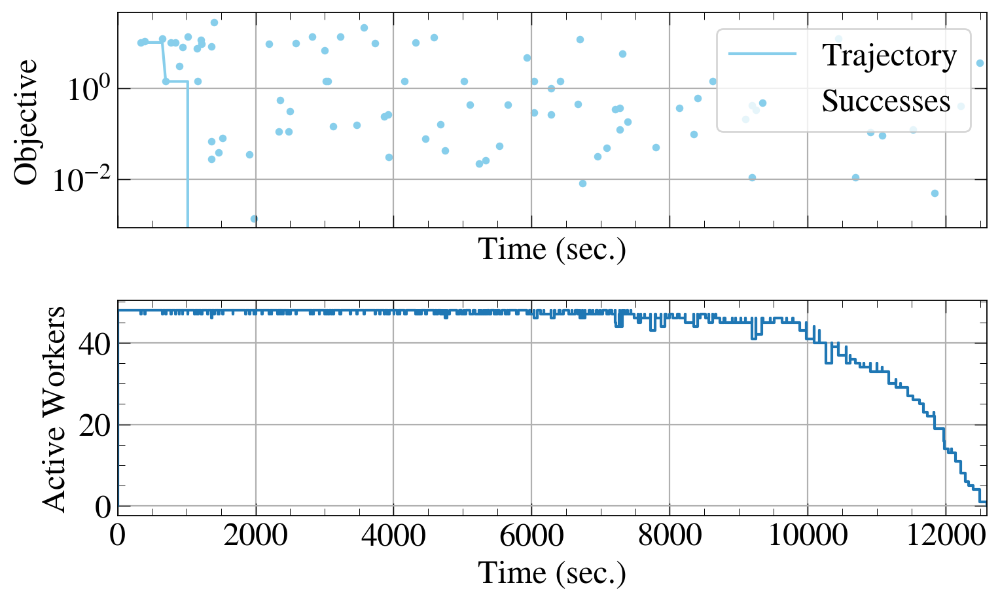

In [57]:
from deephyper.analysis.hpo import plot_search_trajectory_single_objective_hpo
from deephyper.analysis.hpo import plot_worker_utilization

fig, axes = plt.subplots(
    nrows=2,
    ncols=1,
    sharex=True,
    figsize=(WIDTH_PLOTS, HEIGHT_PLOTS),
)

_ = plot_search_trajectory_single_objective_hpo(
    hpo_results,
    mode="min",
    x_units="seconds",
    ax=axes[0],
)
axes[0].set_yscale("log")

_ = plot_worker_utilization(
    hpo_results,
    profile_type="submit/gather",
    ax=axes[1],
)

plt.tight_layout()

Then, we split results between successful and failed results if there are some.

In [58]:
from deephyper.analysis.hpo import filter_failed_objectives

hpo_results, hpo_results_failed = filter_failed_objectives(hpo_results)

hpo_results

,p:batch_size,p:layer_0_activation,p:layer_0_dropout_rate,p:layer_0_units,p:layer_1_activation,p:layer_1_dropout_rate,p:layer_1_units,p:layer_2_activation,p:layer_2_dropout_rate,p:layer_2_units,p:learning_rate,p:lr_scheduler_factor,p:lr_scheduler_patience,p:n_units_mean,p:n_units_std,p:num_layers,p:softplus_factor,p:std_offset,p:layer_3_activation,p:layer_3_dropout_rate,p:layer_3_units,p:layer_4_activation,p:layer_4_dropout_rate,p:layer_4_units,p:layer_5_activation,p:layer_5_dropout_rate,p:layer_5_units,p:layer_6_activation,p:layer_6_dropout_rate,p:layer_6_units,p:layer_7_activation,p:layer_7_dropout_rate,p:layer_7_units,objective,job_id,job_status,m:timestamp_submit,m:train_loss,m:val_loss,m:train_mse,m:val_mse,m:test_loss,m:test_mse,m:budget,m:timestamp_gather
0,353,relu,0.172152,372,mish,0.437546,186,silu,0.185339,358,0.033487,0.221792,12,327,249,3,8.579028,0.000191,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,-10.479076,17,DONE,6.393959,"[34832884000.0, 10.445665, 10.447497, 10.44627...","[38505420000.0, 10.476083, 10.477975, 10.47797...","[10419.7, 19085.479, 19438.594, 19582.865, 192...","[8215.66, 13922.034, 14095.344, 14095.587, 140...",10.478875,1.532074e+04,12,340.545210
1,1173,leaky_relu,0.201514,360,silu,0.106949,187,mish,0.069019,454,0.072533,0.764256,10,305,109,8,2.217692,0.028855,sigmoid,0.232771,147,leaky_relu,0.205181,476,silu,0.141153,374,tanh,0.317290,185,swish,0.470119,90,-11.262401,31,DONE,6.427043,"[32781.633, 10.987082, 11.213574, 11.24408, 11...","[28.347656, 11.036923, 11.238076, 11.266308, 1...","[18104160.0, 183487970.0, 289394100.0, 3068418...","[20365108.0, 177579900.0, 266651680.0, 2832816...",11.259780,2.776316e+08,12,396.312830
2,709,silu,0.065245,433,tanh,0.060792,412,tanh,0.413721,266,0.043152,0.252132,15,168,412,5,1.339139,0.001004,leaky_relu,0.292508,183,swish,0.228777,185,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,-12.699247,41,DONE,6.450066,"[2311938.2, 12.658953, 12.725094, 12.728842, 1...","[1422998.8, 12.639167, 12.699011, 12.701462, 1...","[14253364.0, 73717940.0, 88299390.0, 90611040....","[10826670.0, 48946372.0, 57351870.0, 57721264....",12.703338,5.827394e+07,12,648.062182
3,805,tanh,0.450569,303,swish,0.426029,291,swish,0.053802,153,0.049728,0.413627,17,444,295,4,2.735202,0.000053,sigmoid,0.467738,128,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,-1.438710,43,DONE,6.454651,"[1.8151776, 1.4296122, 1.4274637, 1.4178421, 1...","[1.8284996, 1.4506124, 1.4496108, 1.4398849, 1...","[137.34286, 0.9933956, 0.9943713, 0.9943131, 0...","[138.87752, 1.0396615, 1.0404383, 1.0394443, 1...",1.449107,1.052668e+00,31,698.197341
4,1035,silu,0.198509,237,silu,0.401391,365,relu,0.389199,123,0.010127,0.030978,13,410,403,8,7.892036,0.000035,mish,0.107686,270,relu,0.005998,195,silu,0.309744,509,gelu,0.164705,319,gelu,0.134464,279,-10.571550,33,DONE,6.431764,"[80576824.0, 3704293.8, 13.696427, 14.464111, ...","[28277.13, 8.222084, 13.737092, 14.40653, 14.2...","[450.75497, 1302582.9, 3793377800.0, 117845240...","[647.3759, 2520673.0, 3360787500.0, 9456173000...",10.350391,1.365076e+06,12,776.273396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,450,gelu,0.107624,448,leaky_relu,0.132228,115,relu,0.495488,425,0.001579,0.355536,11,500,357,3,0.310909,0.000295,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,0.249120,216,DONE,9246.486127,"[0.6355629, 0.19156717, 0.08783973, 0.03724038...","[0.49203575, 0.100435086, 0.008889113, -0.0310...","[0.27663317, 0.19761628, 0.17977035, 0.177164,...","[0.23670153, 0.16735691, 0.15996386, 0.1534497...",0.109364,1.331767e-01,65,12399.369295
246,231,gelu,0.237537,357,leaky_relu,0.002782,188,relu,0.332765,404,0.000190,0.104627,11,299,382,8,7.353496,0.003559,gelu,0.451407,378,leaky_relu,0.196560,273,gelu,0.033382,244,swish,0.41666

In [59]:
hpo_results_failed

,p:batch_size,p:layer_0_activation,p:layer_0_dropout_rate,p:layer_0_units,p:layer_1_activation,p:layer_1_dropout_rate,p:layer_1_units,p:layer_2_activation,p:layer_2_dropout_rate,p:layer_2_units,p:learning_rate,p:lr_scheduler_factor,p:lr_scheduler_patience,p:n_units_mean,p:n_units_std,p:num_layers,p:softplus_factor,p:std_offset,p:layer_3_activation,p:layer_3_dropout_rate,p:layer_3_units,p:layer_4_activation,p:layer_4_dropout_rate,p:layer_4_units,p:layer_5_activation,p:layer_5_dropout_rate,p:layer_5_units,p:layer_6_activation,p:layer_6_dropout_rate,p:layer_6_units,p:layer_7_activation,p:layer_7_dropout_rate,p:layer_7_units,objective,job_id,job_status,m:timestamp_submit,m:train_loss,m:val_loss,m:train_mse,m:val_mse,m:test_loss,m:test_mse,m:budget,m:timestamp_gather


We look at the learning curves of the best model and observe improvements in both training and validation loss:

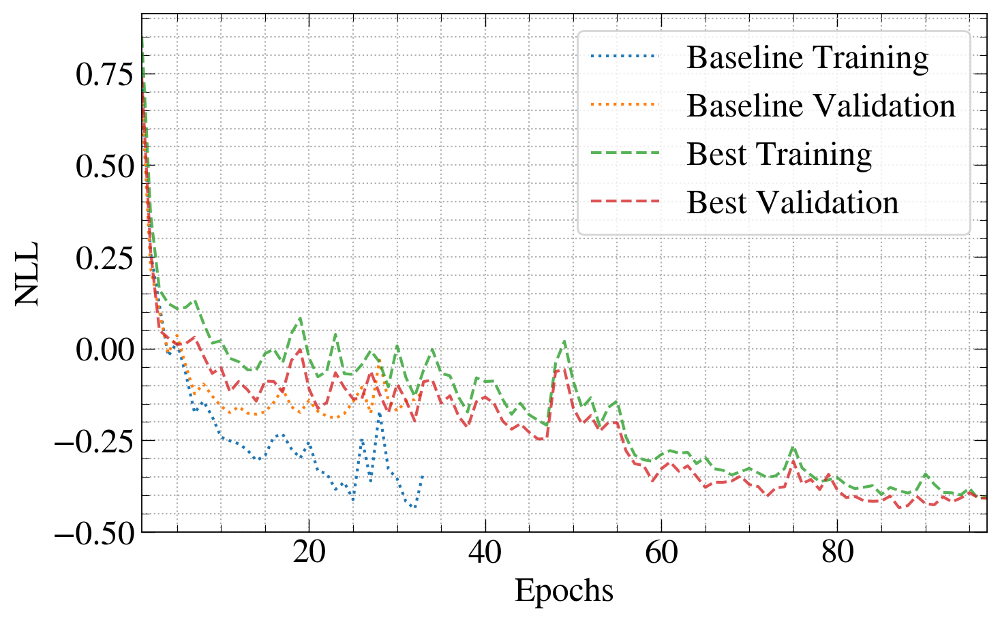

In [60]:
# Make learning curves plot
x_values = np.arange(1, len(baseline_results["metadata"]["train_loss"]) + 1)
x_min, x_max = x_values.min(), x_values.max()
_ = plt.figure(figsize=(WIDTH_PLOTS, HEIGHT_PLOTS))
_ = plt.plot(
    x_values,
    baseline_results["metadata"]["train_loss"],
    linestyle=":",
    label="Baseline Training",
)
_ = plt.plot(
    x_values,
    baseline_results["metadata"]["val_loss"],
    linestyle=":",
    label="Baseline Validation",
)

i_max = hpo_results["objective"].argmax()
train_loss = json.loads(hpo_results.iloc[i_max]["m:train_loss"])
val_loss = json.loads(hpo_results.iloc[i_max]["m:val_loss"])
x_values = np.arange(1, len(train_loss) + 1)
x_max = max(x_max, x_values.max())
_ = plt.plot(
    x_values,
    train_loss,
    alpha=0.8,
    linestyle="--",
    label="Best Training",
)
_ = plt.plot(
    x_values,
    val_loss,
    alpha=0.8,
    linestyle="--",
    label="Best Validation",
)
_ = plt.xlim(x_min, x_max)
_ = plt.grid(which="both", linestyle=":")
_ = plt.legend()
_ = plt.xlabel("Epochs")
_ = plt.ylabel("NLL")

Finally, we look at predictions of this best model and observe that it manage to predict much better than the baseline one the right range.

In [61]:
from deephyper.analysis.hpo import parameters_from_row

# hpo_dir = "nas_regression_icesat_2"
model_checkpoint_dir = os.path.join(hpo_dir, "models")
job_id = hpo_results.iloc[i_max]["job_id"]
file_name = f"model_0.{job_id}.pt"

weights_path = os.path.join(model_checkpoint_dir, file_name)
parameters = parameters_from_row(hpo_results.iloc[i_max])

torch_module = create_model(parameters, y_mu, y_std)
# torch_module = create_model(parameters)

torch_module.load_state_dict(torch.load(weights_path, weights_only=True))
torch_module.eval()

# y_pred_best_autodeuq = torch_module.forward(X_train_tensor)
y_pred_best_autodeuq = torch_module.forward(X_test_tensor)
y_pred_mean_best_autodeuq = to_numpy(y_pred_best_autodeuq.loc)
y_pred_mean_best_autodeuq = scaler_y.inverse_transform(y_pred_mean_best_autodeuq)
y_pred_std_best_autodeuq = to_numpy(y_pred_best_autodeuq.scale)
y_pred_std_best_autodeuq = scaler_y.inverse_transform(y_pred_std_best_autodeuq)
y_pred_mean_best_autodeuq

array([[3.6709504 ],
       [0.01113091],
       [2.4485173 ],
       ...,
       [3.7953193 ],
       [1.1940938 ],
       [2.4982195 ]], dtype=float32)

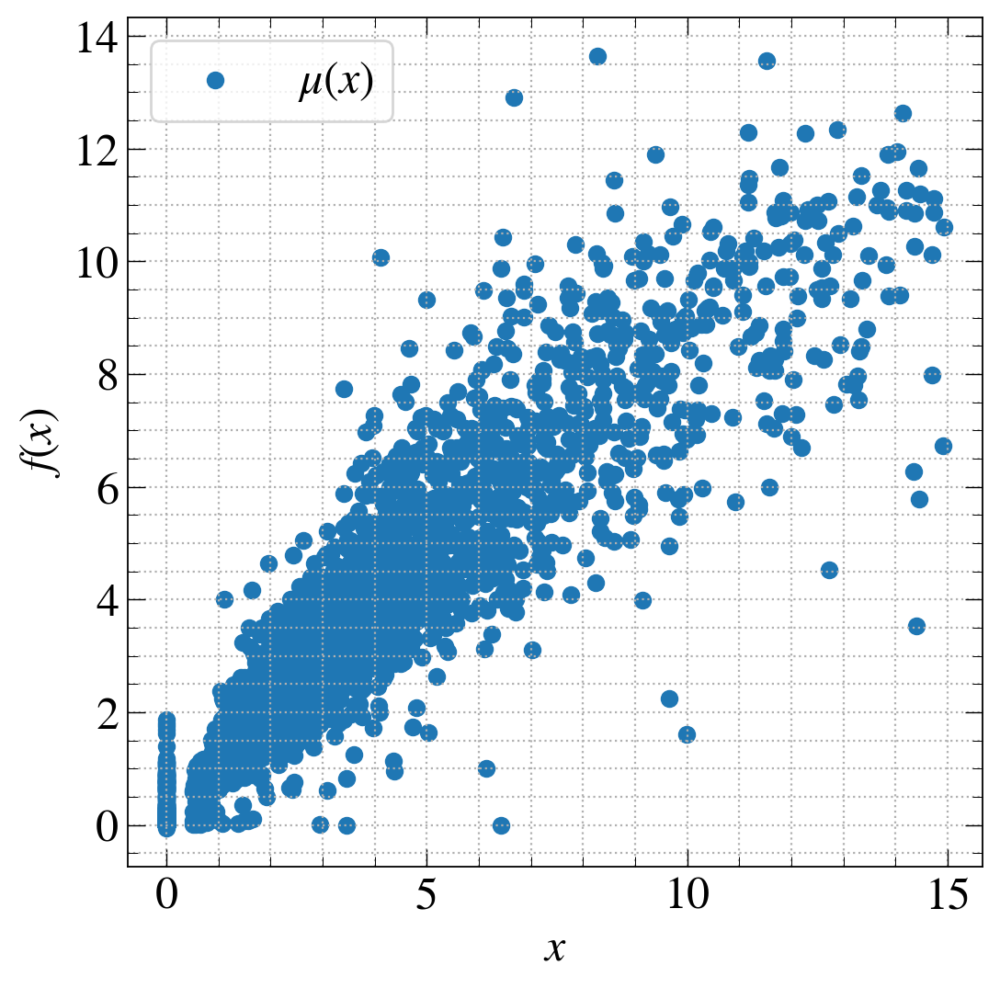

In [62]:
kappa = 1.96
_ = plt.scatter(y_test_copy, y_pred_mean_best_autodeuq, label=r"$\mu(x)$")
# _ = plt.fill_between(
#     test_X.reshape(-1),
#     (y_pred_mean - kappa * y_pred_std).reshape(-1),
#     (y_pred_mean + kappa * y_pred_std).reshape(-1),
#     alpha=0.25,
#     label=r"$\sigma_\text{al}(x)$",
# )
_ = plt.legend(ncols=2)
_ = plt.xlabel(r"$x$")
_ = plt.ylabel(r"$f(x)$")
_ = plt.grid(which="both", linestyle=":")

### Deep Ensemble
After running the neural architecture search we have an available library of checkpointed models. Heer, we combine these models to form an ensemble that can improve both accuracy and provide disentangled uncertainty quantification.

In [64]:
from deephyper.ensemble import EnsemblePredictor
from deephyper.ensemble.aggregator import MixedNormalAggregator
from deephyper.ensemble.loss import NormalNegLogLikelihood
from deephyper.ensemble.selector import GreedySelector, TopKSelector
from deephyper.predictor.torch import TorchPredictor

class NormalTorchPredictor(TorchPredictor):
    def __init__(self, torch_module):
        super().__init__(torch_module.to(device=device, dtype=dtype))

    def pre_process_inputs(self, X):
        return to_torch(X)

    def post_process_predictions(self, y):
        return {
            # "loc": to_numpy(y.loc),
            # "scale": to_numpy(y.scale),
            "loc": scaler_y.inverse_transform(to_numpy(y.loc)),
            "scale": scaler_y.inverse_transform(to_numpy(y.scale)),
        }

After defining the predictor, we load the checkpointed models to collect their predictions into `y_predictors`. These predictions are the inputs of our loss, aggregation and selection functions. We also collect the job ids of the checkpointed models into `job_id_predictors`.

In [65]:
model_checkpoint_dir = os.path.join(hpo_dir, "models")

y_predictors = []
job_id_predictors = []

for file_name in tqdm(os.listdir(model_checkpoint_dir)):
    if not file_name.endswith(".pt"):
        continue

    weights_path = os.path.join(model_checkpoint_dir, file_name)
    job_id = int(file_name[6:-3].split(".")[-1])

    row = hpo_results[hpo_results["job_id"] == job_id]
    if len(row) == 0:
        continue
    assert len(row) == 1

    row = row.iloc[0]
    parameters = parameters_from_row(row)
    torch_module = create_model(parameters, y_mu, y_std)
    # torch_module = create_model(parameters)
    try:
        torch_module.load_state_dict(torch.load(weights_path, weights_only=True))
    except RuntimeError:
        continue

    predictor = NormalTorchPredictor(torch_module)
    y_pred = predictor.predict(np.array(X_val_tensor))
    # y_pred["loc"] = scaler_y.inverse_transform(y_pred["loc"])
    y_predictors.append(y_pred)
    job_id_predictors.append(job_id)
    # print(y_pred)

100%|██████████| 293/293 [00:22<00:00, 12.74it/s]


### Ensemble selection

The top-k selection, selects the topk-k models according to the given `los_func` and weight them equally in the ensemble. The greedy selection, iteratively selects models from the checkpoints that improves the current ensemble.

In [66]:
k = 30

# # Top-K Selection
# selector = TopKSelector(
#     loss_func=NormalNegLogLikelihood(),
#     k=k,
# )

# Greedy Selection
selector = GreedySelector(
    loss_func=NormalNegLogLikelihood(),
    aggregator=MixedNormalAggregator(),
    k=k,
    max_it=k,
    k_init=5,
    early_stopping=False,
    with_replacement=False,
    bagging=False,
    verbose=True,
)

selected_predictors_indexes, selected_predictors_weights = selector.select(
    np.array(y_val_tensor),
    y_predictors,
)

print(f"{selected_predictors_indexes=}")
print(f"{selected_predictors_weights=}")

selected_predictors_job_ids = np.array(job_id_predictors)[selected_predictors_indexes]
print(f"{selected_predictors_job_ids=}")

Ensemble initialized with [10, 227, 57, 92, 59] with loss [2.197789792706888, 2.200743050050411, 2.2051724804642183, 2.2109577167475103, 2.2174048431549416]
Step 1, ensemble is [10, 227, 57, 92, 59, 98], new member 98 with loss 2.2077426058436393
Step 2, ensemble is [10, 227, 57, 92, 59, 98, 81], new member 81 with loss 2.209393791687068
Step 3, ensemble is [10, 227, 57, 92, 59, 98, 81, 38], new member 38 with loss 2.2106982636813295
Step 4, ensemble is [10, 227, 57, 92, 59, 98, 81, 38, 50], new member 50 with loss 2.2120029266404244
Step 5, ensemble is [10, 227, 57, 92, 59, 98, 81, 38, 50, 120], new member 120 with loss 2.213201978878989
Step 6, ensemble is [10, 227, 57, 92, 59, 98, 81, 38, 50, 120, 188], new member 188 with loss 2.2143802651826974
Step 7, ensemble is [10, 227, 57, 92, 59, 98, 81, 38, 50, 120, 188, 37], new member 37 with loss 2.2153719388057485
Step 8, ensemble is [10, 227, 57, 92, 59, 98, 81, 38, 50, 120, 188, 37, 5], new member 5 with loss 2.216376482339724
Step 9,

### Evaluation of the ensemble

In [67]:
ensemble_members = []

# hpo_dir = "nas_regression_icesat_2"
model_checkpoint_dir = os.path.join(hpo_dir, "models")

for job_id in selected_predictors_job_ids:
    file_name = f"model_0.{job_id}.pt"

    weights_path = os.path.join(model_checkpoint_dir, file_name)

    row = hpo_results[hpo_results["job_id"] == job_id].iloc[0]
    parameters = parameters_from_row(row)
    torch_module = create_model(parameters, y_mu, y_std)
    # torch_module = create_model(parameters)
    torch_module.load_state_dict(torch.load(weights_path, weights_only=True))
    ensemble_member = NormalTorchPredictor(torch_module)
    ensemble_members.append(ensemble_member)

ensemble_autodeuq = EnsemblePredictor(
    predictors=ensemble_members,
    # weights=selected_predictors_weights,
    weights=None,
    aggregator=MixedNormalAggregator(decomposed_scale=True),
)

y_pred_ensemble_autodeuq = ensemble_autodeuq.predict(np.array(X_test_tensor))
y_pred_ensemble_autodeuq#["loc"]

{'loc': array([[2.988855  ],
        [0.11111179],
        [2.133185  ],
        ...,
        [2.9989843 ],
        [1.2520864 ],
        [2.2132914 ]], dtype=float32),
 'scale_aleatoric': array([[3.4547715],
        [2.761882 ],
        [2.8365023],
        ...,
        [3.039878 ],
        [2.6294568],
        [2.8467667]], dtype=float32),
 'scale_epistemic': array([[0.29989883],
        [0.09734003],
        [0.16477896],
        ...,
        [0.30544093],
        [0.14324404],
        [0.16385318]], dtype=float32)}

In [71]:
y_predictors_test = []
for model in ensemble_members:
    model_pred_y = model.predict(np.array(X_test_tensor))
    y_predictors_test.append(model_pred_y)
# y_predictors_test

In [72]:
print([i for i in selected_predictors_job_ids], "\n")
selected_predictors_job_ids2 = np.array(list(selected_predictors_job_ids[1:6]) + list(selected_predictors_job_ids[7:]))
selected_predictors_weights2 = selected_predictors_weights[1:6] + selected_predictors_weights[7:]
print(selected_predictors_job_ids2)
print(selected_predictors_weights2)

[45, 145, 77, 134, 70, 170, 4, 175, 69, 97, 28, 9, 73, 230, 223, 168, 247, 67, 169, 246, 221, 64, 179, 118, 218, 197, 226, 184, 62, 153] 

[145  77 134  70 170 175  69  97  28   9  73 230 223 168 247  67 169 246
 221  64 179 118 218 197 226 184  62 153]
[0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333]


In [73]:
selected_dicts = [y_predictors_test[i] for i in range(len(y_predictors_test))]
len(selected_dicts)

30

In [74]:
# Extract and stack all "loc" values into a single array
loc_values = np.stack([d["loc"].reshape(-1) for d in selected_dicts])  # shape: (n_items, n_values_per_item)
len(loc_values)
loc_values

# Compute mean and standard deviation
elementwise_means = np.mean(loc_values, axis=0)
elementwise_stds = np.std(loc_values, axis=0)

print("Element-wise means:", elementwise_means)
print("Element-wise stds:", elementwise_stds)

Element-wise means: [2.988855   0.11111179 2.133185   ... 2.9989843  1.2520864  2.2132914 ]
Element-wise stds: [0.29989883 0.09734003 0.16477896 ... 0.30544093 0.14324404 0.16385318]


In [75]:
loc_values = [selected_dicts[i]["loc"].reshape(-1) for i in range(len(selected_dicts))]  # shape: (n_items, n_values_per_item)
stacked = np.stack(loc_values)  # Shape: (n_arrays, array_length)
len(stacked[0])

elementwise_means = np.mean(stacked, axis=0)
elementwise_stds = np.std(stacked, axis=0)

print("Length of the element-wise means:", len(elementwise_means))
print("Length of the element-wise std:", len(elementwise_stds))
print("Element-wise means:", elementwise_means)
print("Element-wise stds:", elementwise_stds)

Length of the element-wise means: 6563
Length of the element-wise std: 6563
Element-wise means: [2.988855   0.11111179 2.133185   ... 2.9989843  1.2520864  2.2132914 ]
Element-wise stds: [0.29989883 0.09734003 0.16477896 ... 0.30544093 0.14324404 0.16385318]


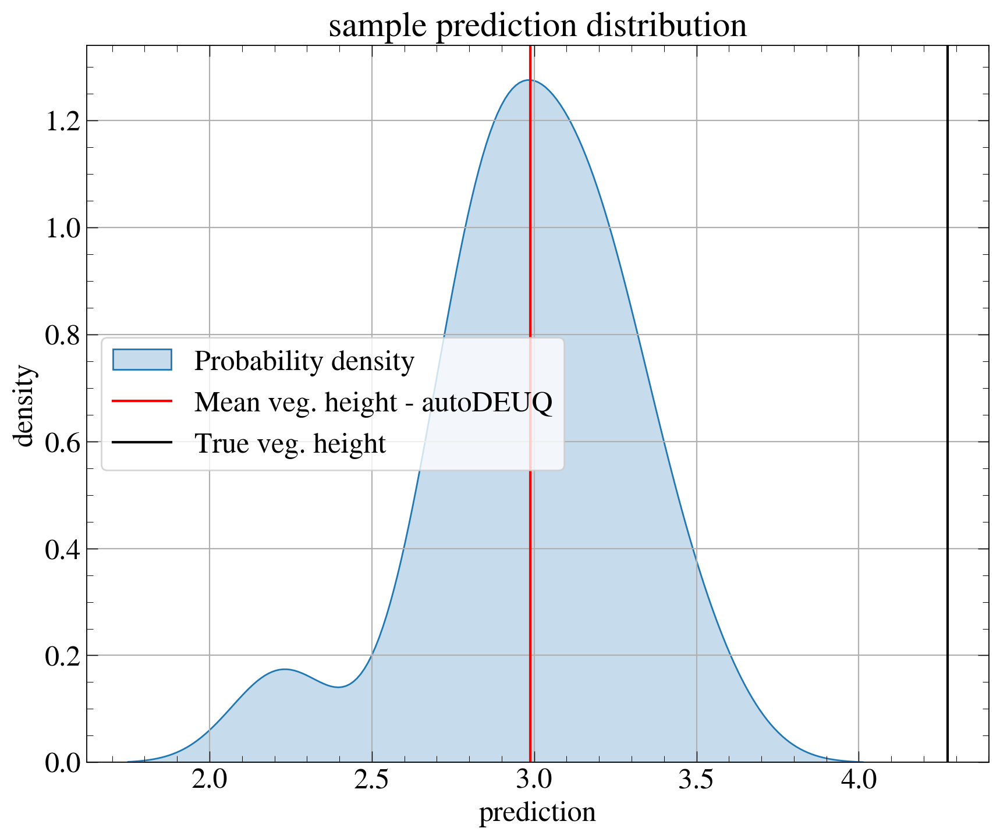

In [78]:
plt.figure(figsize=(10,8))
n = 0
sns.kdeplot(stacked[:,n], shade=True, label = "Probability density")
# plt.axvline(elementwise_means[n], color='red', label = "Mean veg. height - autoDEUQ")
plt.axvline(y_pred_ensemble_autodeuq["loc"].reshape(-1)[n], color='red', label = "Mean veg. height - autoDEUQ")
plt.axvline(y_test_copy[n], color="black", label = "True veg. height")
plt.xlabel("prediction")
plt.ylabel("density")
plt.title("sample prediction distribution")
plt.legend()
plt.show()

### Epistemic Uncertainty

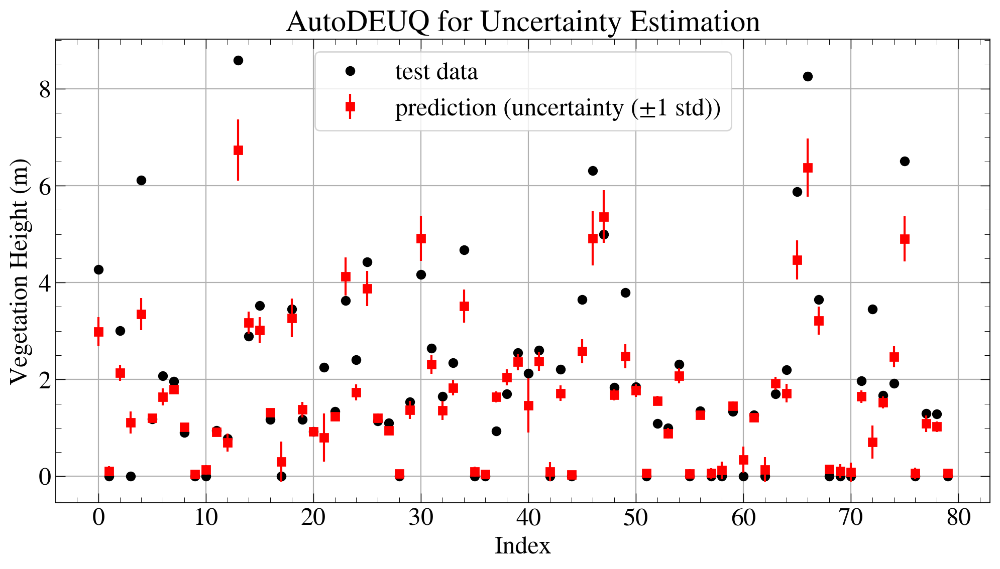

In [79]:
plt.figure(figsize=(12,6))
k = 80
# kappa = 1.96
total_uncertainty = y_pred_ensemble_autodeuq["scale_aleatoric"].reshape(-1)+y_pred_ensemble_autodeuq["scale_epistemic"].reshape(-1)
plt.plot(y_test_copy[:k], color="black", label="test data", marker = "o", linestyle="None")

# plt.errorbar(list(range(k)), 
#              y_pred_ensemble_autodeuq["loc"].reshape(-1)[:k], 
#              yerr = total_uncertainty[:k], 
#              color="red", alpha=1.0, 
#              label="prediction (uncertainty (±1 std))", 
#              linestyle="None", fmt='s')

plt.errorbar(list(range(k)), 
             y_pred_ensemble_autodeuq["loc"].reshape(-1)[:k], 
             yerr = elementwise_stds[:k], 
             color="red", alpha=1.0, 
             label="prediction (uncertainty (±1 std))", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
plt.title("AutoDEUQ for Uncertainty Estimation")
plt.show()

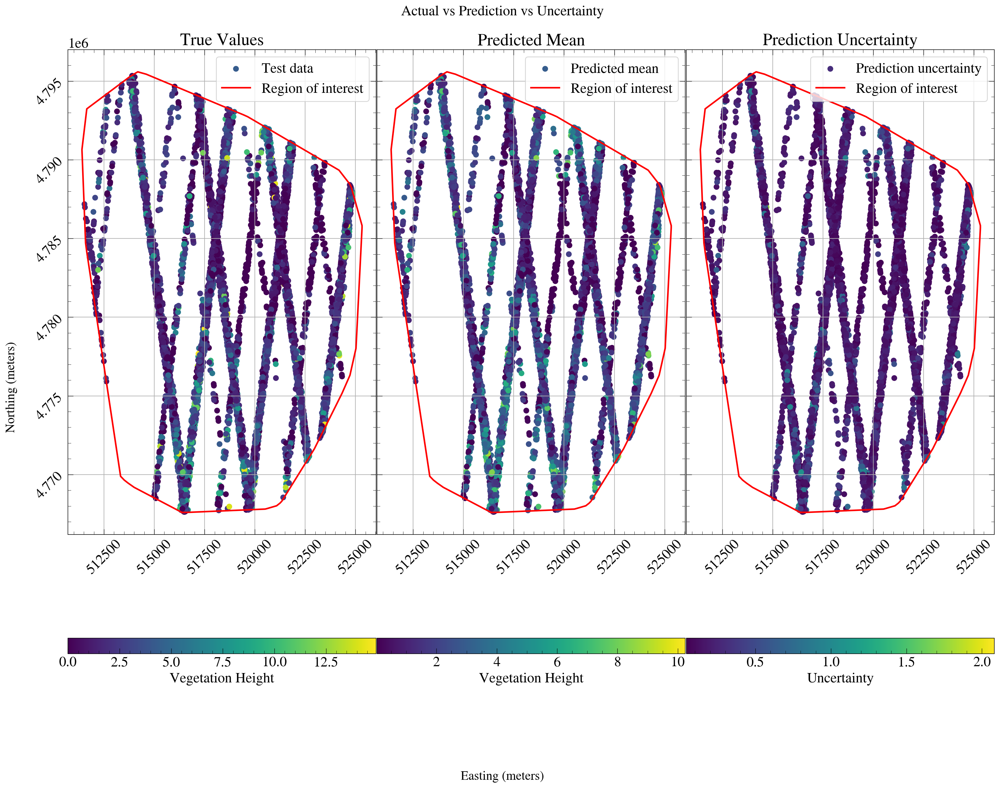

In [84]:
# k = 300
k = len(y_test_copy)
fig, ax = plt.subplots(1, 3, figsize=(18, 14), sharey=True)  # 1 row, 3 columns

# Plot the first scatter plot on the first axis (ax[0])
scatter1 = ax[0].scatter(X_test_copy[:, 8][:k], X_test_copy[:, 9][:k],
                          c=y_test_copy[:k], cmap="viridis", s=40, alpha=1.0, label="Test data")
ax[0].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar1 = plt.colorbar(scatter1, ax=ax[0], orientation="horizontal")
cbar1.set_label("Vegetation Height")
ax[0].set_title("True Values")
ax[0].legend()

# Plot the second scatter plot on the second axis (ax[1])
scatter2 = ax[1].scatter(X_test_copy[:, 8][:k], X_test_copy[:, 9][:k],
                          c=y_pred_ensemble_autodeuq["loc"].reshape(-1)[:k], cmap="viridis", s=40, alpha=1.0, label="Predicted mean")
ax[1].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar2 = plt.colorbar(scatter2, ax=ax[1], orientation="horizontal")
cbar2.set_label("Vegetation Height")
ax[1].set_title("Predicted Mean")
ax[1].legend()

# Plot the third scatter plot on the third axis (ax[2])
scatter3 = ax[2].scatter(X_test_copy[:, 8][:k], X_test_copy[:, 9][:k],
                          c=y_pred_ensemble_autodeuq["scale_epistemic"].reshape(-1)[:k], cmap="viridis", s=40, alpha=1.0, label="Prediction uncertainty")
ax[2].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar3 = plt.colorbar(scatter3, ax=ax[2], orientation="horizontal")
cbar3.set_label("Uncertainty")
ax[2].set_title("Prediction Uncertainty")
ax[2].legend()

# Super labels
fig.supxlabel(r"Easting (meters)", va="center", ha="center", fontsize=16)
fig.supylabel(r"Northing (meters)", va="center", ha="center", fontsize=16)
plt.suptitle("Actual vs Prediction vs Uncertainty", fontsize=18)


# Rotate x-axis tick labels for all subplots
for axis in ax:
    plt.sca(axis)  # Set current axis
    plt.xticks(rotation=45)  # Rotate x-tick labels
    plt.yticks(rotation=45)  # Rotate y-tick labels

# Adjust layout
plt.tight_layout(h_pad = -1.0, w_pad = -0.4)
plt.show()

## The Random Forest Model

In [ ]:
# Define the model (RandomForestRegressor)
rf_model = RandomForestRegressor(n_estimators=100,  # Number of trees in the forest 
                                 max_depth=5,       # Maximum depth of each tree 
                                 random_state=42,   # Setting seed
                                 bootstrap=True     # Bootstrapping for randomness
)

# KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation

# Initialize lists to store the average losses for each fold
train_losses = []
val_losses = []

# Perform KFold Cross-Validation
for fold, (train_idx, val_idx) in enumerate(kf.split(X_train_0)):
    print(f"Training Fold {fold+1}")
    # Create train and validation subsets using the indices
    X_train, X_val = X_train_0[train_idx], X_train_0[val_idx]
    y_train, y_val = y_train_0[train_idx], y_train_0[val_idx]

    # Train the model on the training data
    rf_model.fit(X_train, y_train.ravel())  # .ravel() to convert y to a 1D array

    # Predict on the training and validation data
    y_train_pred = rf_model.predict(X_train)
    y_val_pred = rf_model.predict(X_val)

    # Calculate MSE for both training and validation
    train_loss = mean_squared_error(y_train, y_train_pred)
    val_loss = mean_squared_error(y_val, y_val_pred)

    # Store the losses
    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f"Fold {fold+1} - Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

# # Plotting the train and validation loss across all folds
# plt.figure(figsize=(10, 6))
# plt.plot(train_losses, label="Train Loss")
# plt.plot(val_losses, label="Validation Loss")
# plt.title("Train vs Validation Loss Across Folds")
# plt.xlabel("Folds")
# plt.ylabel("Loss")
# plt.legend()
# plt.grid(True)
# plt.show()

# Final average losses across all folds
avg_train_loss = np.mean(train_losses)
avg_val_loss = np.mean(val_losses)

print(f"Average Training Loss: {avg_train_loss:.4f}")
print(f"Average Validation Loss: {avg_val_loss:.4f}")

In [86]:
########################################################################
########################################################################
# Get predictions from all individual trees
all_tree_preds_rf = np.stack([tree.predict(X_test_copy) for tree in rf_model.estimators_])

# Compute mean and std across all trees
y_pred_mean_rf = []
y_pred_std_rf = []
# Compute mean and standard deviation of the inverse predictions to get the actual predictions and standard deviations
for i in range(all_tree_preds_rf.shape[1]):
    pred_avg_rf = np.mean(all_tree_preds_rf[:,i].reshape(-1, 1))
    y_pred_mean_rf.append(float(pred_avg_rf))    
    
    pred_sd_rf = np.std(all_tree_preds_rf[:,i].reshape(-1, 1))
    y_pred_std_rf.append(float(pred_sd_rf))
    
display(np.array(y_pred_mean_rf))
display(np.array(y_pred_std_rf))
y_test_copy

array([3.59200473, 0.        , 2.34136775, ..., 2.97876898, 1.0376687 ,
       2.618993  ])

array([0.23378252, 0.        , 0.1871386 , ..., 0.1976468 , 0.12180439,
       0.18909555])

array([4.2742434, 0.       , 3.0066223, ..., 5.1692233, 1.2177277,
       2.5601981])

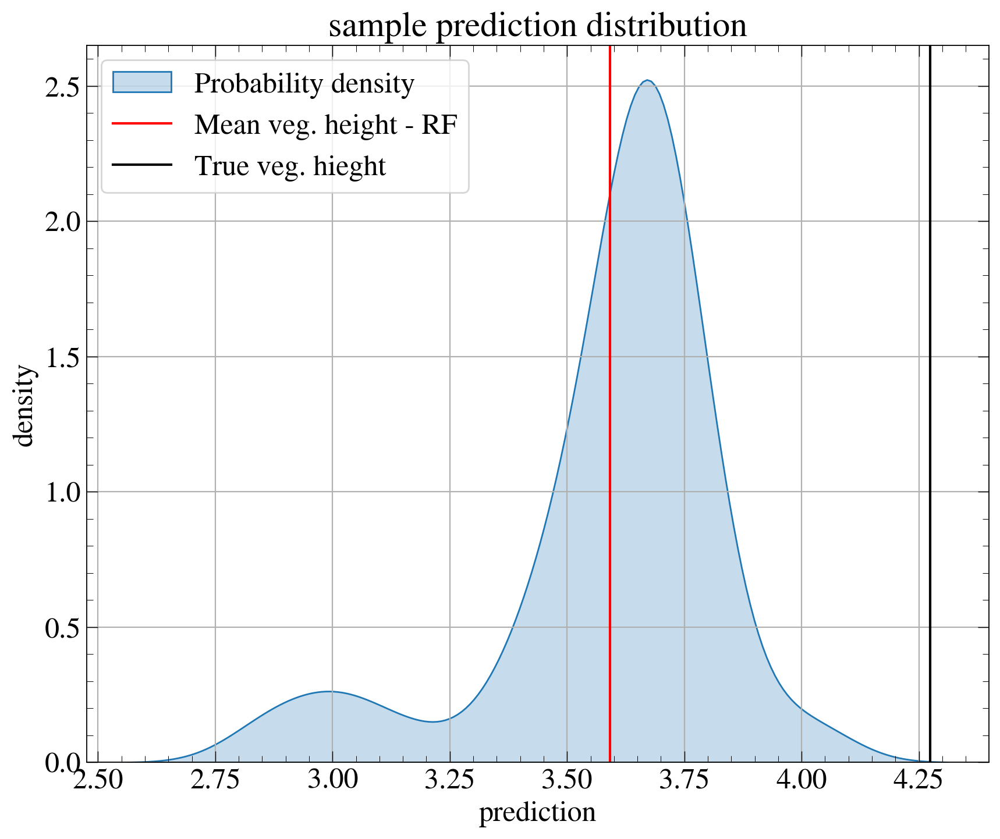

In [87]:
plt.figure(figsize=(10,8))
n = 0
sns.kdeplot(all_tree_preds_rf[:, n].reshape(-1, 1).flatten(), shade=True, label = "Probability density")
plt.axvline(y_pred_mean_rf[n], color='red', label = "Mean veg. height - RF")
plt.axvline(y_test_copy[n], color="black", label = "True veg. hieght")
plt.xlabel("prediction")
plt.ylabel("density")
plt.title("sample prediction distribution")
plt.legend()
plt.show()

## Diagnosing Models
### Prediction Distributions

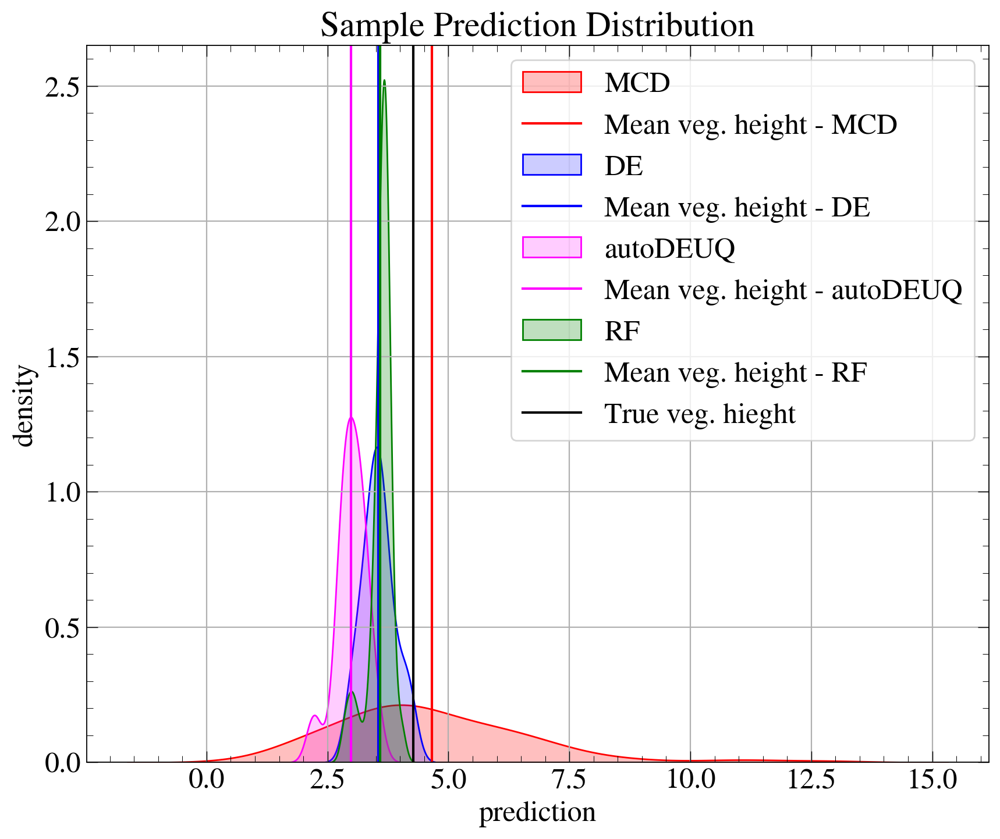

In [90]:
plt.figure(figsize=(10,8))
n = 0

# dropout
sns.kdeplot(scaler_y.inverse_transform(predictions_mcd[:,n]).reshape(-1, 1).flatten(), fill=True, color="red", label = "MCD")
plt.axvline(pred_mean_inv_mcd[n], color="red", label = "Mean veg. height - MCD")

# deep ensembles
sns.kdeplot(scaler_y.inverse_transform(ensemble_preds[:, n].reshape(-1, 1)).flatten(), fill=True, color="blue", alpha = 0.2, label="DE")
plt.axvline(pred_mean_inv_de[n], color="blue", label = "Mean veg. height - DE")

# autoDEUQ
array_autodeuq = np.array([arr[n] for arr in loc_values])
sns.kdeplot(array_autodeuq, fill=True, color="magenta", alpha = 0.2, label="autoDEUQ")
plt.axvline(elementwise_means[n], color="magenta", label = "Mean veg. height - autoDEUQ")
# plt.axvline(y_pred_ensemble_autodeuq["loc"][n], color="magenta", label = "Mean veg. height - autoDEUQ")

# random forest
sns.kdeplot(all_tree_preds_rf[:, n].reshape(-1, 1).flatten(), fill=True, label = "RF", color="green")
plt.axvline(y_pred_mean_rf[n], color="green", label = "Mean veg. height - RF")
plt.axvline(y_test_copy[n], color="black", label = "True veg. hieght")
plt.xlabel("prediction")
plt.ylabel("density")
plt.title("Sample Prediction Distribution")
plt.legend()
plt.show()

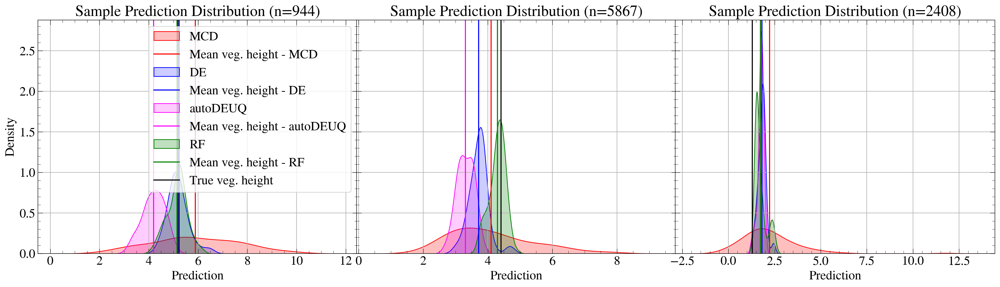

In [91]:
# Here, we select 3 random indices to plot
random_indices = random.sample(range(len(y_test_copy)), 3)

# Create subplots
fig, axs = plt.subplots(1, 3, figsize=(20, 6), sharey=True)

for i, n in enumerate(random_indices):
    ax = axs[i]

    # Dropout (MCD)
    sns.kdeplot(
        scaler_y.inverse_transform(predictions_mcd[:, n]).reshape(-1, 1).flatten(),
        fill=True, color="red", label="MCD", ax=ax
    )
    ax.axvline(pred_mean_inv_mcd[n], color="red", label="Mean veg. height - MCD")

    # Deep Ensembles
    sns.kdeplot(
        scaler_y.inverse_transform(ensemble_preds[:, n].reshape(-1, 1)).flatten(),
        fill=True, color="blue", alpha=0.2, label="DE", ax=ax
    )
    ax.axvline(pred_mean_inv_de[n], color="blue", label="Mean veg. height - DE")

    # autoDEUQ
    array_autodeuq = np.array([arr[n] for arr in loc_values])
    sns.kdeplot(array_autodeuq, fill=True, color="magenta", alpha=0.2, label="autoDEUQ", ax=ax)
    ax.axvline(elementwise_means[n], color="magenta", label="Mean veg. height - autoDEUQ")

    # Random Forest
    sns.kdeplot(all_tree_preds_rf[:, n].reshape(-1, 1).flatten(), fill=True, label="RF", color="green", ax=ax)
    ax.axvline(y_pred_mean_rf[n], color="green", label="Mean veg. height - RF")
    ax.axvline(y_test_copy[n], color="black", label="True veg. height")

    ax.set_title(f"Sample Prediction Distribution (n={n})")
    ax.set_xlabel("Prediction")
    ax.set_ylabel("Density")
    if i == 0: 
        ax.legend()
        
plt.tight_layout(h_pad=0.0, w_pad=-0.20)
plt.show()


### Actual vs Predicted Plot

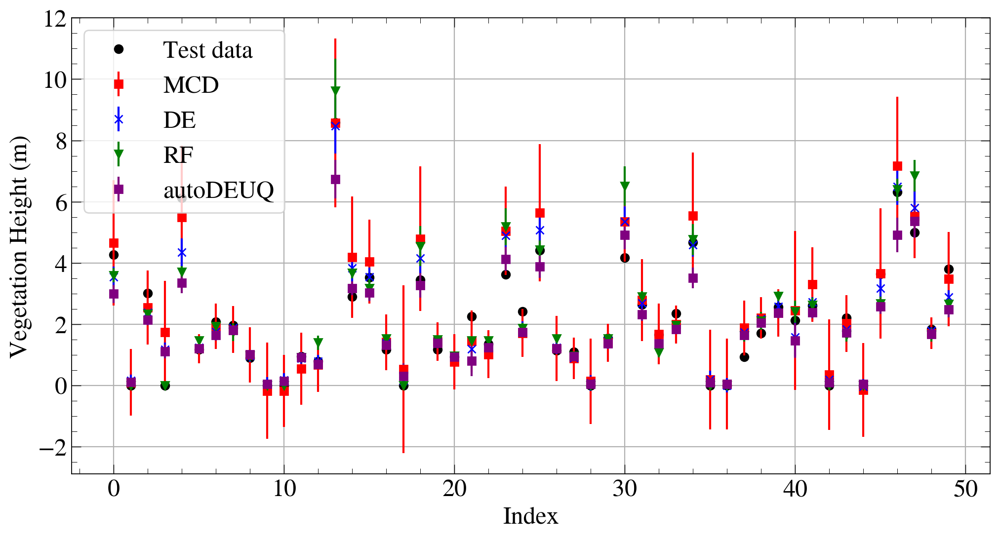

In [92]:
plt.figure(figsize=(12,6))
k = 50

# dropout
plt.plot(y_test_copy[:k], color="black", label="Test data", marker = "o", linestyle="None")
plt.errorbar(list(range(k)), 
             pred_mean_inv_mcd[:k], 
             yerr = pred_std_inv_mcd[:k], 
             color="red", alpha=1.0, 
             label="MCD", 
             linestyle="None", fmt="s")

#########################
#########################
# deep ensembles
plt.errorbar(list(range(k)), 
             pred_mean_inv_de[:k], 
             yerr = pred_std_inv_de[:k], 
             color="blue", alpha=1.0, 
             label="DE", 
             linestyle="None", fmt="x")

#########################
#########################
# random forest
plt.errorbar(list(range(k)), 
             y_pred_mean_rf[:k], 
             yerr = y_pred_std_rf[:k], 
             color="green", alpha=1.0, 
             label="RF", 
             linestyle="None", fmt="v")

#########################
#########################
# autoDEUQ
plt.errorbar(list(range(k)), 
             y_pred_ensemble_autodeuq["loc"].reshape(-1)[:k], 
             yerr = elementwise_stds[:k], 
             # yerr = y_pred_ensemble_autodeuq["scale_epistemic"].reshape(-1)[:k],
             color="purple", alpha=1.0, 
             label="autoDEUQ", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
# plt.title("Uncertainty Estimation")
plt.show()


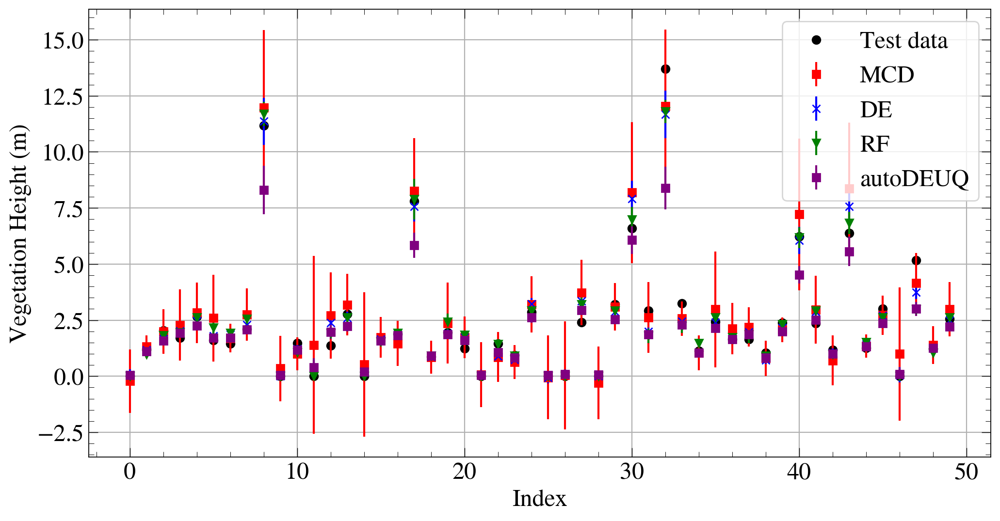

In [93]:
plt.figure(figsize=(12,6))
k = 50

# dropout
plt.plot(y_test_copy[-k:], color="black", label="Test data", marker = "o", linestyle="None")
plt.errorbar(list(range(k)), 
             pred_mean_inv_mcd[-k:], 
             yerr = pred_std_inv_mcd[-k:], 
             color="red", alpha=1.0, 
             label="MCD", 
             linestyle="None", fmt="s")

#########################
#########################
# deep ensembles
plt.errorbar(list(range(k)), 
             pred_mean_inv_de[-k:], 
             yerr = pred_std_inv_de[-k:], 
             color="blue", alpha=1.0, 
             label="DE", 
             linestyle="None", fmt="x")

#########################
#########################
# random forest
plt.errorbar(list(range(k)), 
             y_pred_mean_rf[-k:], 
             yerr = y_pred_std_rf[-k:], 
             color="green", alpha=1.0, 
             label="RF", 
             linestyle="None", fmt="v")

#########################
#########################
# autoDEUQ
plt.errorbar(list(range(k)), 
             y_pred_ensemble_autodeuq["loc"].reshape(-1)[-k:], 
             yerr = elementwise_stds[-k:],
             # yerr = y_pred_ensemble_autodeuq["scale_epistemic"].reshape(-1)[-k:],
             color="purple", alpha=1.0, 
             label="autoDEUQ", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
# plt.title("Uncertainty Estimation")
plt.show()

### Scatter Plots

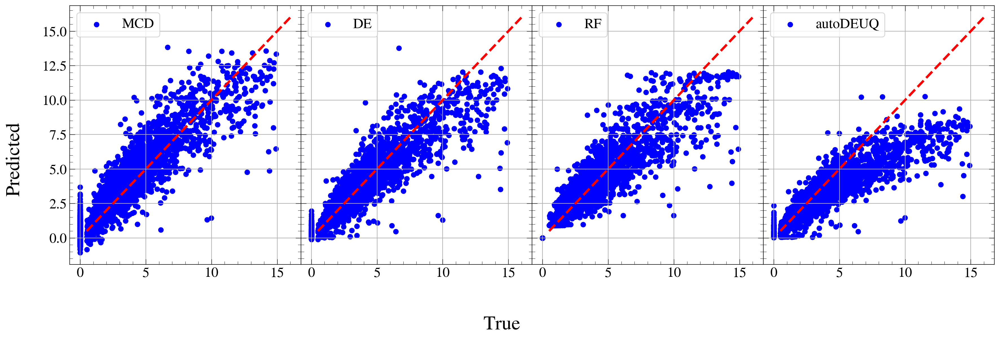

In [94]:
xx = np.linspace(0.5, 16)

# Create figure and subplots with shared y-axis
fig, axs = plt.subplots(1, 4, figsize=(18, 6), sharey=True)

#########################
#########################
# Subplot 1: MCD
axs[0].scatter(y_test_copy, pred_mean_inv_mcd, color="blue", label = "MCD")
axs[0].plot(xx, xx, color="red", linestyle="--", linewidth = 3)
# axs[0].set_title("True vs Predicted MCD")
axs[0].legend()

#########################
#########################
# Subplot 2: DE
axs[1].scatter(y_test_copy, pred_mean_inv_de, color="blue", label = "DE")
axs[1].plot(xx, xx, color="red", linestyle="--", linewidth = 3)
# axs[1].set_title("True vs Predicted DE")
axs[1].legend()

#########################
#########################
# Subplot 3: RF
axs[2].scatter(y_test_copy, y_pred_mean_rf, color="blue", label = "RF")
axs[2].plot(xx, xx, color="red", linestyle="--", linewidth = 3)
# axs[2].set_title("True vs Predicted RF")
axs[2].legend()

#########################
#########################
# Subplot 4: autoDEUQ
axs[3].scatter(y_test_copy, y_pred_ensemble_autodeuq["loc"], color="blue", label = "autoDEUQ")
# axs[3].scatter(y_test_copy, elementwise_means, color="blue")
axs[3].plot(xx, xx, color="red", linestyle="--", linewidth = 3)
# axs[3].set_title("True vs Predicted autoDEUQ")
axs[3].legend()

#########################
#########################
# Super labels
fig.supxlabel(r"True", va="center", ha="center", fontsize=25)
fig.supylabel(r"Predicted", va="center", ha="center", fontsize=25)
# plt.suptitle("True vs Predicted", fontsize=18)

# Adjust layout
plt.tight_layout(h_pad=-1.0, w_pad=0.0)
plt.show()

### Correlation Plot

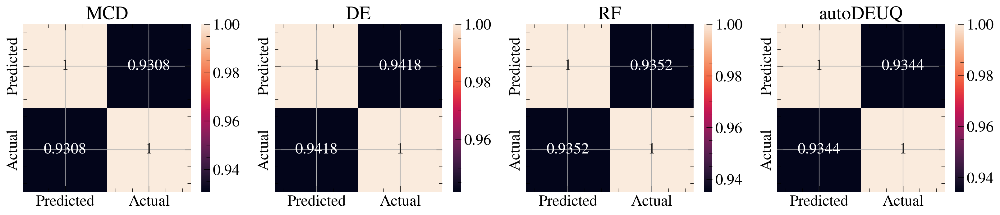

In [95]:
#-------------Correlation plot (MCD)
plt.figure(figsize = (20, 3.5))

#########################
#########################
#-------------Correlation plot (MCD)
plt.subplot(1, 4, 1)
cor_mcd = pd.DataFrame(pred_mean_inv_mcd).rename(columns = {0:"Predicted"})\
.join(pd.DataFrame(y_test_copy, columns = ['Actual']))

corrMatrix_mcd = cor_mcd.corr()
sns.heatmap(corrMatrix_mcd, annot=True, fmt=".4g")
plt.title("MCD")

#########################
#########################
#-------------Correlation plot (DE)
plt.subplot(1, 4, 2)
cor_de = pd.DataFrame(pred_mean_inv_de).rename(columns = {0:"Predicted"})\
.join(pd.DataFrame(y_test_copy, columns = ['Actual']))

corrMatrix_de = cor_de.corr()
sns.heatmap(corrMatrix_de, annot=True, fmt=".4g")
plt.title("DE")

#########################
#########################
#-------------Correlation plot (RF)
plt.subplot(1, 4, 3)
cor_rf = pd.DataFrame(y_pred_mean_rf).rename(columns = {0:"Predicted"})\
.join(pd.DataFrame(y_test_copy, columns = ['Actual']))

corrMatrix_rf = cor_rf.corr()
sns.heatmap(corrMatrix_rf, annot=True, fmt=".4g")
plt.title("RF")

#########################
#########################
#-------------Correlation plot (autoDEUQ)
plt.subplot(1, 4, 4)
# cor_autodeuq = pd.DataFrame(elementwise_means).rename(columns = {0:"Predicted"})\
# .join(pd.DataFrame(y_test_copy, columns = ['Actual']))

cor_autodeuq = pd.DataFrame(y_pred_ensemble_autodeuq["loc"].reshape(-1)).rename(columns = {0:"Predicted"})\
.join(pd.DataFrame(y_test_copy, columns = ['Actual']))

corrMatrix_autodeuq = cor_autodeuq.corr()
sns.heatmap(corrMatrix_autodeuq, annot=True, fmt=".4g")
plt.title("autoDEUQ")
plt.show()

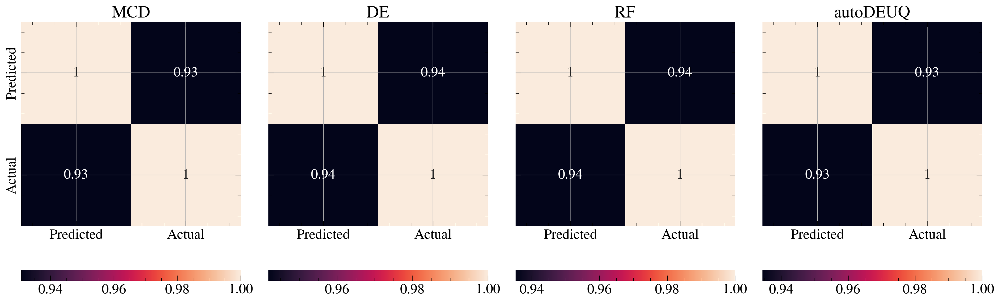

In [96]:
# Create subplots
fig, axs = plt.subplots(1, 4, figsize=(18, 6), sharey=True)

#########################
#########################
# MCD subplot
cor_mcd = pd.DataFrame(pred_mean_inv_mcd).rename(columns={0: "Predicted"}) \
    .join(pd.DataFrame(y_test_copy, columns=['Actual']))
corrMatrix_mcd = cor_mcd.corr()
sns.heatmap(corrMatrix_mcd, annot=True, fmt=".2g", ax=axs[0], cbar_kws={'orientation': 'horizontal'})
axs[0].set_title("MCD")

#########################
#########################
# DE subplot
cor_de = pd.DataFrame(pred_mean_inv_de).rename(columns={0: "Predicted"}) \
    .join(pd.DataFrame(y_test_copy, columns=['Actual']))
corrMatrix_de = cor_de.corr()
sns.heatmap(corrMatrix_de, annot=True, fmt=".2g", ax=axs[1], cbar_kws={'orientation': 'horizontal'})
axs[1].set_title("DE")

#########################
#########################
# RF subplot
cor_rf = pd.DataFrame(y_pred_mean_rf).rename(columns={0: "Predicted"}) \
    .join(pd.DataFrame(y_test_copy, columns=['Actual']))
corrMatrix_rf = cor_rf.corr()
sns.heatmap(corrMatrix_rf, annot=True, fmt=".2g", ax=axs[2], cbar_kws={'orientation': 'horizontal'})
axs[2].set_title("RF")

#########################
#########################
# autoDEUQ subplot
# cor_autodeuq = pd.DataFrame(elementwise_means).rename(columns = {0:"Predicted"})\
# .join(pd.DataFrame(y_test_copy, columns = ['Actual']))

cor_autodeuq = pd.DataFrame(y_pred_ensemble_autodeuq["loc"].reshape(-1)).rename(columns = {0:"Predicted"})\
.join(pd.DataFrame(y_test_copy, columns = ['Actual']))

corrMatrix_autodeuq = cor_autodeuq.corr()
sns.heatmap(corrMatrix_autodeuq, annot=True, fmt=".2g", ax=axs[3], cbar_kws={'orientation': 'horizontal'})
axs[3].set_title("autoDEUQ")

plt.tight_layout()
plt.show()


### Prediction Errors

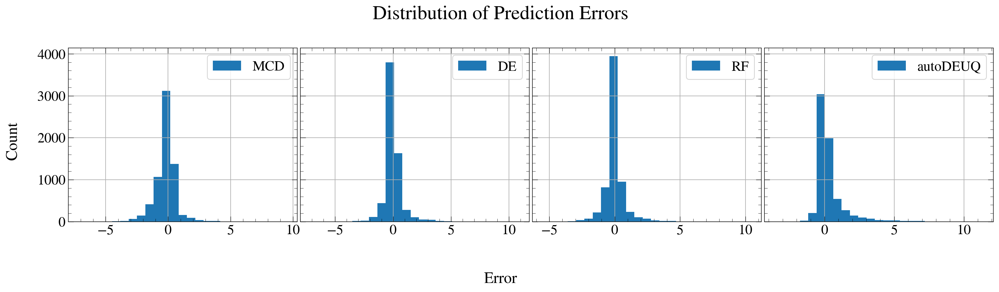

In [97]:
# Create subplots with shared y-axis
fig, axs = plt.subplots(1, 4, figsize=(18, 5), sharey=True)

#########################
#########################
# Histogram of errors (MCD)
error_mcd = y_test_copy - pred_mean_inv_mcd
axs[0].hist(error_mcd, bins=25, label = "MCD")
# axs[0].set_title("Prediction Errors (MCD)")
axs[0].legend()

#########################
#########################
# Histogram of errors (DE)
error_de = y_test_copy - pred_mean_inv_de
axs[1].hist(error_de, bins=25, label = "DE")
# axs[1].set_title("Prediction Errors (DE)")
axs[1].legend()

#########################
#########################
# Histogram of errors (RF)
error_rf = y_test_copy - y_pred_mean_rf
axs[2].hist(error_rf, bins=25, label = "RF")
# axs[2].set_title("Prediction Errors (RF)")
axs[2].legend()

#########################
#########################
# Histogram of errors (autoDEUQ)
error_autodeuq = y_test_copy - y_pred_ensemble_autodeuq["loc"].reshape(-1)
# error_autodeuq = y_test_copy - elementwise_means
axs[3].hist(error_autodeuq, bins=25, label = "autoDEUQ")
# axs[3].set_title("Prediction Errors (autoDEUQ)")
axs[3].legend()

# Super labels
fig.supxlabel(r"Error", va="center", ha="center", fontsize=20)
fig.supylabel(r"Count", va="center", ha="center", fontsize=20)
# Add a super title for the entire figure
plt.suptitle("Distribution of Prediction Errors", fontsize=25)

# Adjust layout
plt.tight_layout(h_pad = 0.0, w_pad = -0.05)
plt.show()

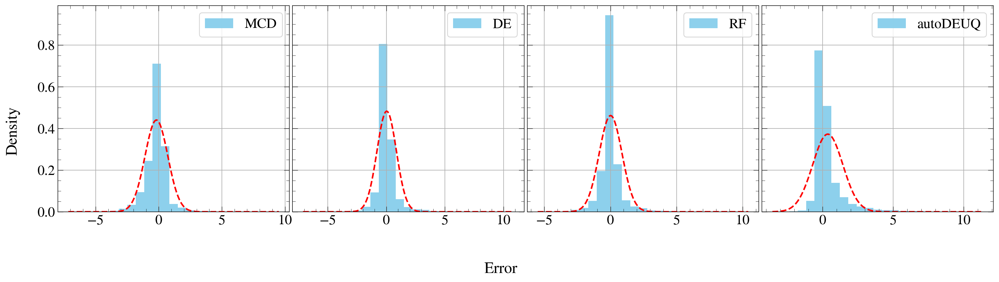

In [98]:
# Create subplots with shared y-axis
fig, axs = plt.subplots(1, 4, figsize=(18, 5), sharey=True)

#########################
#########################
# Histogram + Density (MCD)
error_mcd = y_test_copy - pred_mean_inv_mcd
mu_mcd, std_mcd = np.mean(error_mcd), np.std(error_mcd)
x_mcd = np.linspace(min(error_mcd), max(error_mcd), 200)
axs[0].hist(error_mcd, bins=25, density=True, alpha=0.95, color="skyblue", label="MCD")
axs[0].plot(x_mcd, norm.pdf(x_mcd, mu_mcd, std_mcd), "r--", linewidth=2)
# axs[0].set_title("Prediction Errors (MCD)")
axs[0].legend()

#########################
#########################
# Histogram + Density (DE)
error_de = y_test_copy - pred_mean_inv_de
mu_de, std_de = np.mean(error_de), np.std(error_de)
x_de = np.linspace(min(error_de), max(error_de), 200)
axs[1].hist(error_de, bins=25, density=True, alpha=0.95, color="skyblue", label="DE")
axs[1].plot(x_de, norm.pdf(x_de, mu_de, std_de), "r--", linewidth=2)
# axs[1].set_title("Prediction Errors (DE)")
axs[1].legend()

#########################
#########################
# Histogram + Density (RF)
error_rf = y_test_copy - y_pred_mean_rf
mu_rf, std_rf = np.mean(error_rf), np.std(error_rf)
x_rf = np.linspace(min(error_rf), max(error_rf), 200)
axs[2].hist(error_rf, bins=25, density=True, alpha=0.95, color="skyblue", label="RF")
axs[2].plot(x_rf, norm.pdf(x_rf, mu_rf, std_rf), "r--", linewidth=2)
# axs[2].set_title("Prediction Errors (RF)")
axs[2].legend()

#########################
#########################
# Histogram + Density (autoDEUQ)
# error_autodeuq = y_test_copy - elementwise_means
error_autodeuq = y_test_copy - y_pred_ensemble_autodeuq["loc"].reshape(-1)
mu_autodeuq, std_autodeuq = np.mean(error_autodeuq), np.std(error_autodeuq)
x_autodeuq = np.linspace(min(error_autodeuq), max(error_autodeuq), 200)
axs[3].hist(error_autodeuq, bins=25, density=True, alpha=0.95, color="skyblue", label="autoDEUQ")
axs[3].plot(x_autodeuq, norm.pdf(x_autodeuq, mu_autodeuq, std_autodeuq), "r--", linewidth=2)
# axs[3].set_title("Prediction Errors (autoDEUQ)")
axs[3].legend()

# Super labels
fig.supxlabel("Error", va="center", ha="center", fontsize=20)
fig.supylabel("Density", va="center", ha="center", fontsize=20)
# plt.suptitle("Distribution of Prediction Errors with Normal Density", fontsize=25)

# Adjust layout
plt.tight_layout(h_pad=0.0, w_pad=-0.05)
plt.show()

### Compute Root Mean Square Error (RMSE) 

In [99]:
rmse_mcd = np.sqrt(mean_squared_error(y_test_copy, pred_mean_inv_mcd))
rmse_de = np.sqrt(mean_squared_error(y_test_copy, pred_mean_inv_de))
rmse_rf = np.sqrt(mean_squared_error(y_test_copy, y_pred_mean_rf))
rmse_autodeuq = np.sqrt(mean_squared_error(y_test_copy, y_pred_ensemble_autodeuq["loc"]))
print("RMSE(MCD):", rmse_mcd)
print("RMSE(DE):", rmse_de)
print("RMSE(RF):", rmse_rf)
print("RMSE(autoDEUQ):", rmse_autodeuq)

RMSE(MCD): 0.9241623331833383
RMSE(DE): 0.8262351701806644
RMSE(RF): 0.8633848015042129
RMSE(autoDEUQ): 1.1301548130719252


### Compute R-Squared ($R^2$)

In [100]:
r2_mcd = r2_score(y_test_copy, pred_mean_inv_mcd)
r2_de = r2_score(y_test_copy, pred_mean_inv_de)
r2_rf = r2_score(y_test_copy, y_pred_mean_rf)
r2_autodeuq = r2_score(y_test_copy, y_pred_ensemble_autodeuq["loc"])

display(Math(f"R^2 (MCD) = {r2_mcd}"))
display(Math(f"R^2 (DE) = {r2_de}"))
display(Math(f"R^2 (RF) = {r2_rf}"))
display(Math(f"R^2 autoDEUQ) = {r2_autodeuq}"))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

### Variable Importance

Below are the predictors/feature in the GEDI data that are used in the various models and their respective meanings.


- `h_mean_canopy`: average relief height for canopy photons. This is the variable we are predicting.
- `spot`: laser spot 1 to 6.
- `gnd_ph_count`: number of ground photons used by PhoREAL algorithm for this extent.
- `ph_count`: total number of photons used by PhoREAL algorithm for this extent.
- `solar_elevation_x`: solar elevation from ATL03 at time of measurement, in degrees.
- `veg_ph_count`: number of vegetation (canopy and top of canopy) photons used by PhoREAL.
- `landcover`: flag indicating if segment includes land surfaces.
- `cycle`: cycle.
- `num_bins`: size of the vertical photon bin in meters.
- `Easting`: Easting coordinate (UTM).
- `Northing`: Northing coordinate (UTM).
- `elevation_NAVD88_icesat2_from_crs`: Ground elevation, reprojected to much the coordiante reference system as our ground truth airborne lidar data. 
- `ICESat2_slope_degrees_utm`: Computed slope between footprints/segments (in degrees).
      
      
#### Random Forest

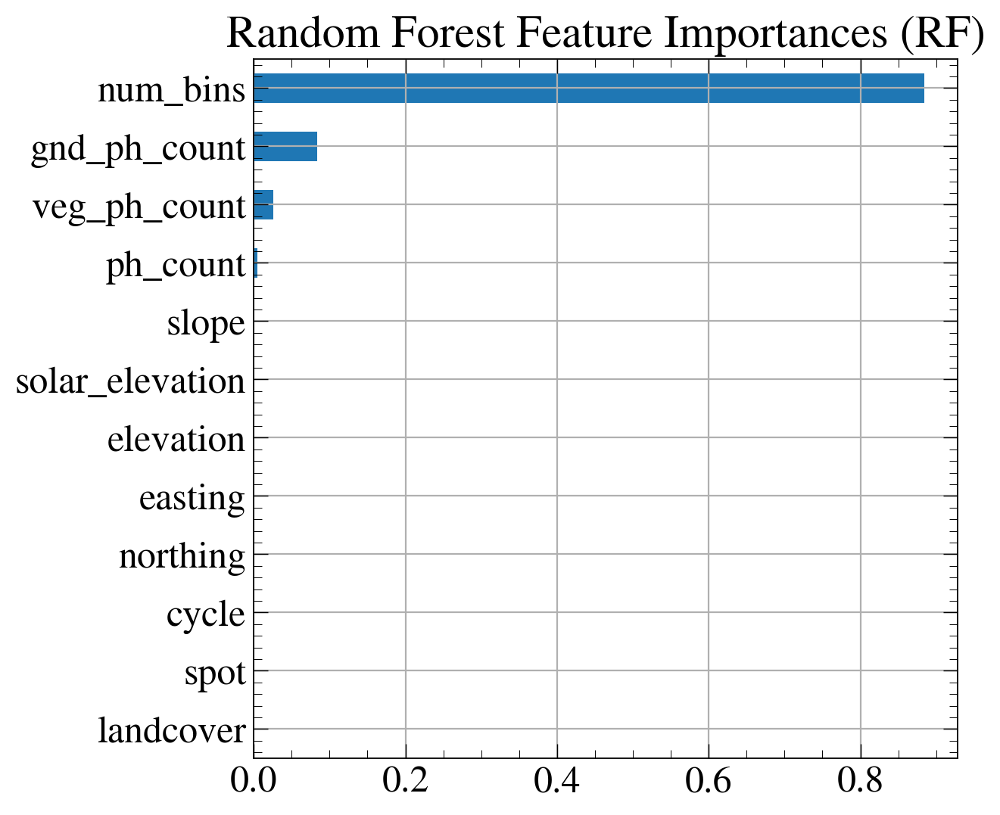

In [101]:
from sklearn.inspection import permutation_importance

# all_feature_names = icesat2_data.drop("h_mean_canopy", axis = 1).columns
all_feature_names =['spot', 'gnd_ph_count', 'ph_count', 'solar_elevation', 'veg_ph_count', 
                    'landcover', 'cycle', 'num_bins', 'easting', 'northing', 'elevation', 'slope']
all_feature_names = np.array(all_feature_names)

importances = rf_model.feature_importances_

# Plot
pd.Series(importances, index=all_feature_names).sort_values().plot(kind='barh')
plt.title("Random Forest Feature Importances (RF)")
plt.show()

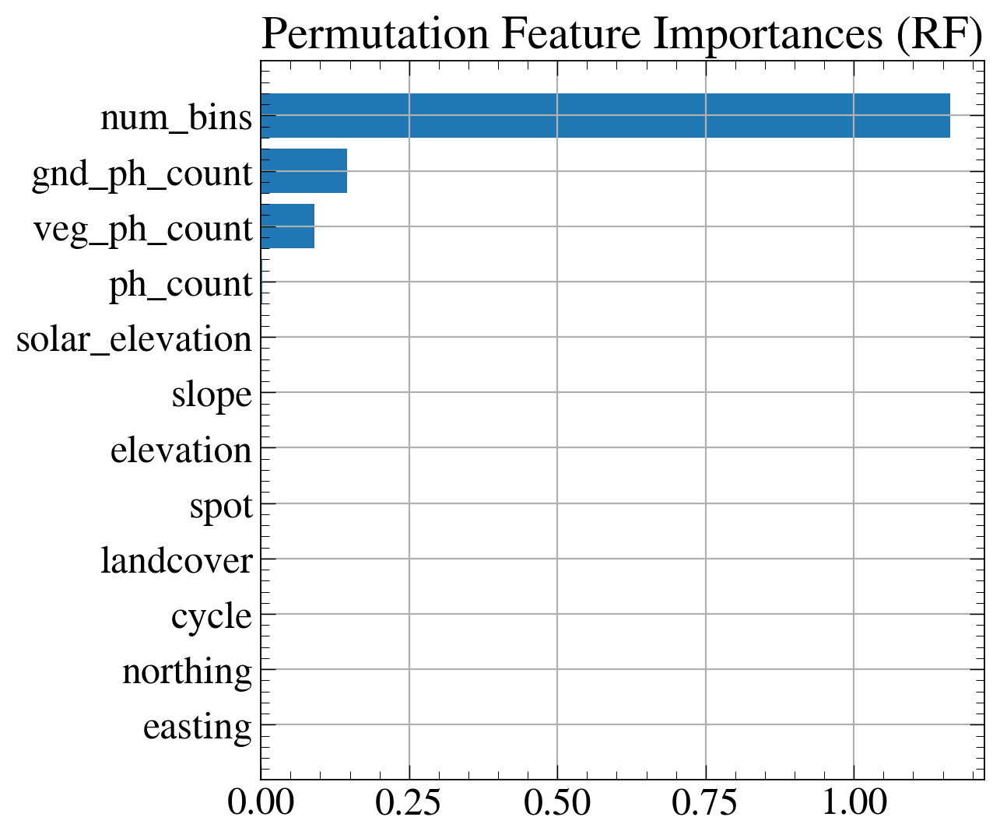

In [102]:
result = permutation_importance(rf_model, X_test_copy, y_test_copy, n_repeats=30, random_state=42, scoring='r2')
sorted_idx = result.importances_mean.argsort()

plt.barh(all_feature_names[sorted_idx], result.importances_mean[sorted_idx])
plt.title("Permutation Feature Importances (RF)")
plt.show()

#### Monte Carlo Dropout

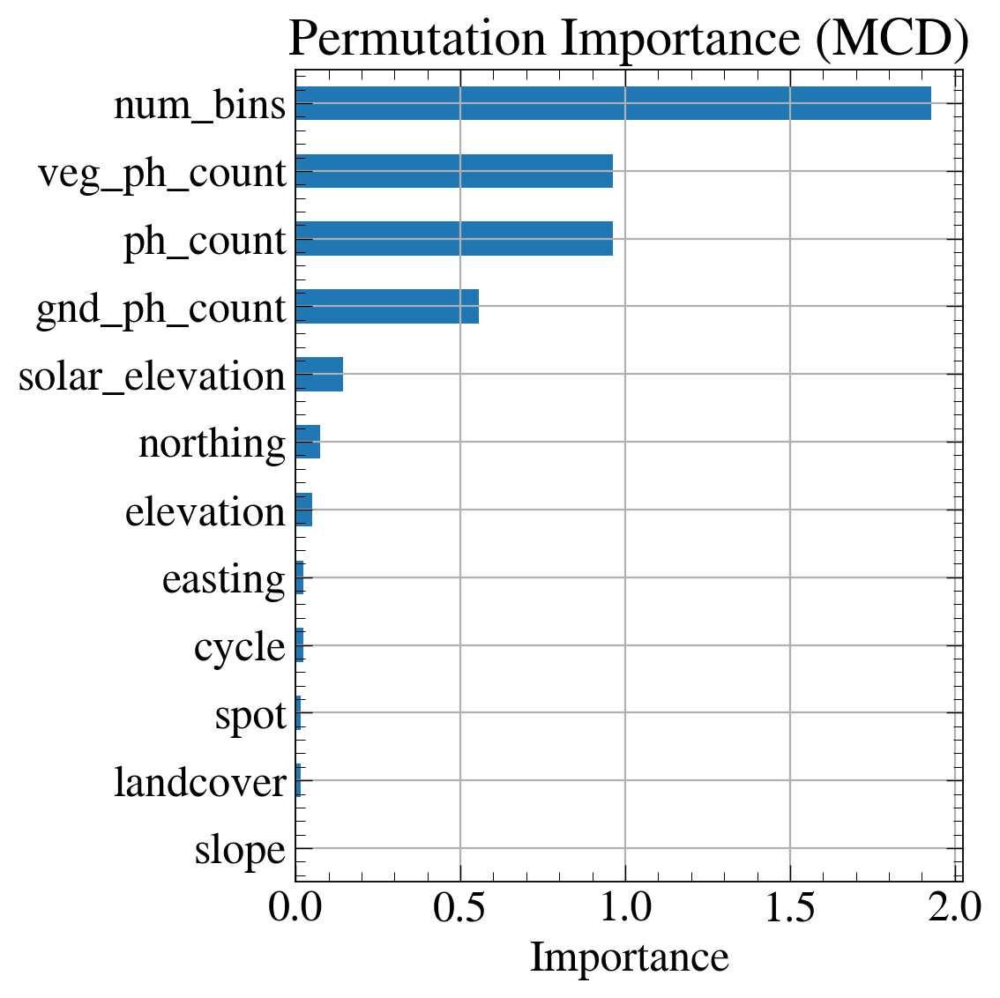

In [103]:
def mcd_predict_fn(X):
    # Generate predictions with MC dropout
    n_samples = 100
    predictions_mcd = mc_dropout_predict(model_mcd, X, n_samples)

    pred_mean_inv_mcd = []
    # Compute mean and standard deviation of the inverse predictions to get the actual predictions and standard deviations
    for i in range(predictions_mcd.shape[1]):
        pred_avg_mcd = np.mean(scaler_y.inverse_transform(predictions_mcd[:,i]))
        pred_mean_inv_mcd.append(float(pred_avg_mcd))
    return np.array(pred_mean_inv_mcd)

#########################################################
#########################################################
def compute_permutation_importance(X, y_true, predict_fn, n_repeats=10, scoring="rmse", scaler_y=None):
    """
    model: PyTorch model with dropout
    X: input tensor (torch.Tensor)
    y_true: ground truth (numpy array)
    predict_fn: function that returns predictions from the model (e.g., MCD)
    feature_names: list of feature names
    n_repeats: number of permutations
    scoring: 'rmse' or 'r2'
    scaler_y: if targets were scaled, inverse transform before scoring
    """
    baseline_preds = predict_fn(X)
    if scaler_y:
        y_true = scaler_y.inverse_transform(y_true.reshape(-1, 1)).flatten()

    if scoring == "rmse":
        def score_func(y_true, y_pred):
            return np.sqrt(np.mean((y_true - y_pred) ** 2))
    elif scoring == "r2":
        def score_func(y_true, y_pred):
            y_mean = np.mean(y_true)
            return 1 - np.sum((y_true - y_pred) ** 2) / np.sum((y_true - y_mean) ** 2)
    else:
        raise ValueError("Unknown scoring method")

    baseline_score = score_func(y_true, baseline_preds)
    importances = []

    for i in range(X.shape[1]):
        scores = []
        for _ in range(n_repeats):
            X_permuted = X.clone()
            idx = torch.randperm(X.shape[0])
            X_permuted[:, i] = X[idx, i]  # Permute one feature column

            y_pred_perm = predict_fn(X_permuted)
            score = score_func(y_true, y_pred_perm)
            scores.append(score)

        mean_score = np.mean(scores)
        importance = mean_score - baseline_score if scoring == "rmse" else baseline_score - mean_score
        importances.append(importance)
    return np.array(importances)

importances_mcd = compute_permutation_importance(
    X=X_test_tensor,
    y_true=y_test_copy,
    predict_fn=mcd_predict_fn,
    n_repeats=30,
    scoring="rmse", # # or "r2"
    scaler_y=None  # pass only if you transformed y
    # scaler_y=scaler_y  # pass only if you transformed y
)

# Plot the importance in a barchart
importance_mcd_series = pd.Series(importances_mcd, index=all_feature_names)
importance_mcd_series = importance_mcd_series.sort_values()
importance_mcd_series.plot(kind='barh')
plt.title("Permutation Importance (MCD)")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()

#### Deep Ensembles

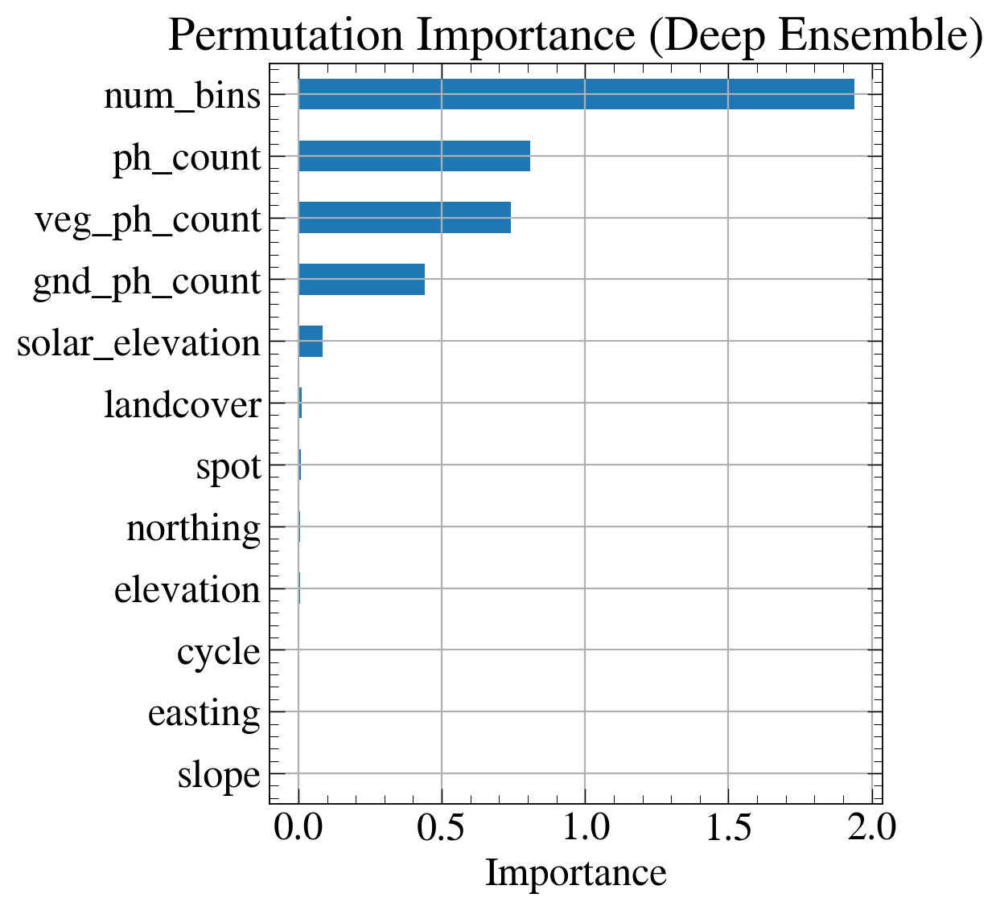

In [104]:
def ensemble_predict_de(X):
    preds = []
    for model in ensemble_models:
        model.eval()
        with torch.no_grad():
            pred = model(X)
            preds.append(pred.cpu().numpy())
    preds = np.array(preds)  # shape: (ensemble_size, batch_size, output_dim)

    # Take mean across ensemble dimension
    pred_mean = np.mean(preds, axis=0)  # shape: (batch_size, output_dim)

    # Inverse transform if needed
    pred_mean_inv_de = scaler_y.inverse_transform(pred_mean).flatten()
    return pred_mean_inv_de

importances_de = compute_permutation_importance(
    X=X_test_tensor,
    y_true=y_test_copy,
    predict_fn=ensemble_predict_de,
    n_repeats=30,
    scoring="rmse",
    scaler_y=None  # Already inverse transformed in predict_fn
)

# Plot the importance in a barchart
importance_de_series = pd.Series(importances_de, index=all_feature_names)
importance_de_series = importance_de_series.sort_values()
importance_de_series.plot(kind="barh")
plt.title("Permutation Importance (Deep Ensemble)")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()

#### autoDEUQ

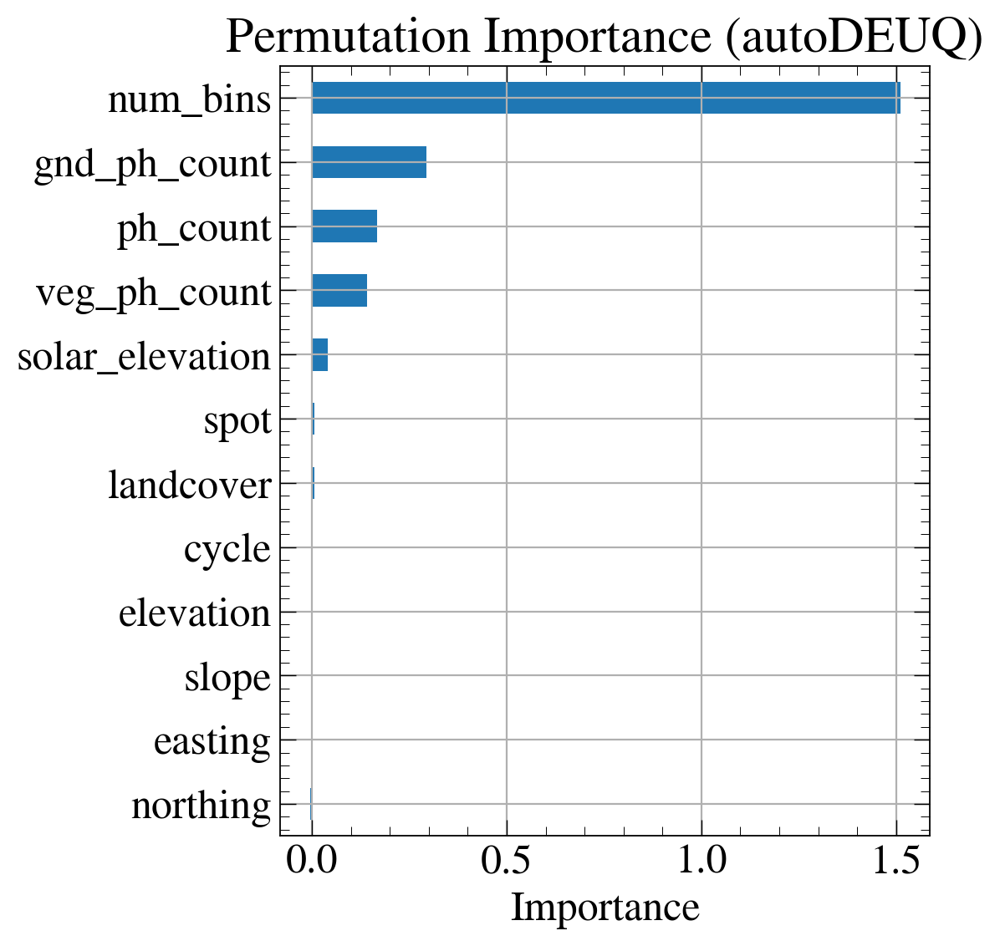

In [105]:
def compute_autodeuq_permutation_importance(X, y_true, predict_fn, n_repeats=10, scoring="rmse", scaler_y=None):
    """
    X: input tensor (torch.Tensor)
    y_true: ground truth (numpy array)
    predict_fn: function or model that returns predictions (expects dict with 'loc')
    feature_names: list of feature names
    n_repeats: number of permutations
    scoring: 'rmse' or 'r2'
    scaler_y: if targets were scaled, inverse transform before scoring
    """
    # Get baseline prediction and extract the mean prediction ("loc")
    baseline_output = predict_fn.predict(np.array(X))
    baseline_preds = np.array(baseline_output["loc"]).flatten()

    if scaler_y:
        y_true = scaler_y.inverse_transform(y_true.reshape(-1, 1)).flatten()

    # Define scoring function
    if scoring == "rmse":
        def score_func(y_true, y_pred):
            return np.sqrt(np.mean((y_true - y_pred) ** 2))
    elif scoring == "r2":
        def score_func(y_true, y_pred):
            y_mean = np.mean(y_true)
            return 1 - np.sum((y_true - y_pred) ** 2) / np.sum((y_true - y_mean) ** 2)
    else:
        raise ValueError("Unknown scoring method")

    baseline_score = score_func(y_true, baseline_preds)
    importances = []

    for i in range(X.shape[1]):
        scores = []
        for _ in range(n_repeats):
            X_permuted = X.clone()
            idx = torch.randperm(X.shape[0])
            X_permuted[:, i] = X[idx, i]  # Permute one feature column

            pred_output_perm = predict_fn.predict(np.array(X_permuted))
            pred_perm = np.array(pred_output_perm["loc"]).flatten()
            score = score_func(y_true, pred_perm)
            scores.append(score)

        mean_score = np.mean(scores)
        importance = mean_score - baseline_score if scoring == "rmse" else baseline_score - mean_score
        importances.append(importance)

    return np.array(importances)

importances_autodeuq = compute_autodeuq_permutation_importance(
    X=X_test_tensor,
    y_true=y_test_copy,
    predict_fn=ensemble_autodeuq,
    n_repeats=30,
    scoring="rmse",
    scaler_y=None  # Already inverse transformed in ensemble_autodeuq
)

# Plot the importance in a barchart
importance_autodeuq_series = pd.Series(importances_autodeuq, index=all_feature_names)
importance_autodeuq_series = importance_autodeuq_series.sort_values()
importance_autodeuq_series.plot(kind="barh")
plt.title("Permutation Importance (autoDEUQ)")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()

### Putting it All Together

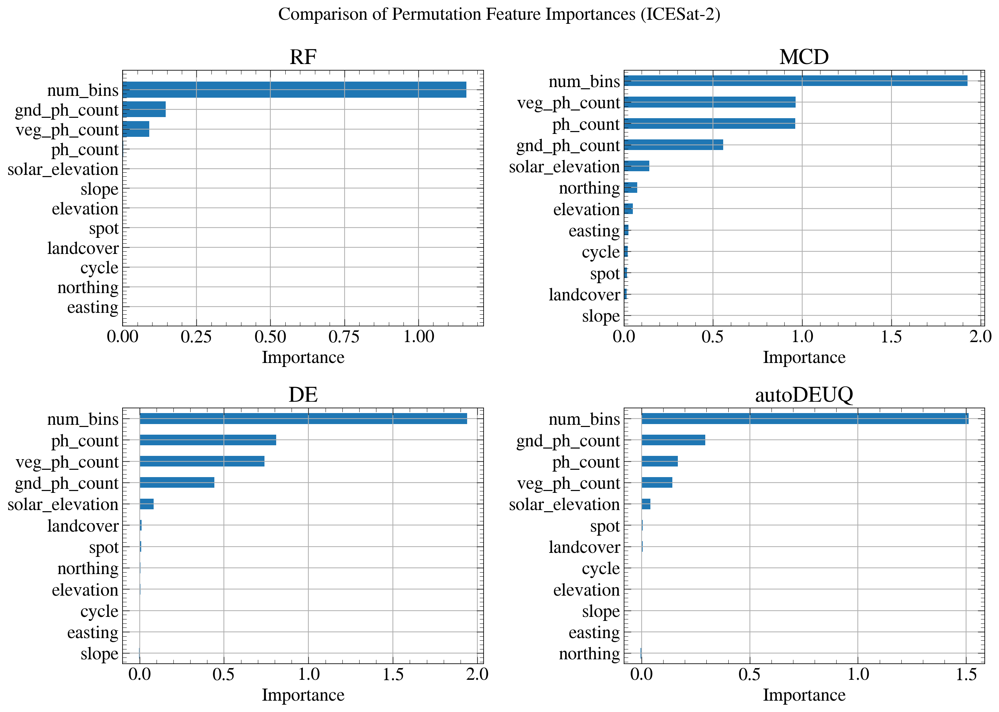

In [106]:
# subplot grid
fig, axs = plt.subplots(2, 2, figsize=(14, 10))  # Adjust size as needed
axs = axs.flatten()  # Flatten to easily index with axs[0], axs[1], etc.

# Random Forest
axs[0].barh(all_feature_names[sorted_idx], result.importances_mean[sorted_idx])
axs[0].set_title("RF")
# axs[0].set_title("Permutation Feature Importances (RF)")
axs[0].set_xlabel("Importance")
axs[0].grid(True)

# Monte Carlo Dropout (MCD)
importance_mcd_series.plot(kind='barh', ax=axs[1])
axs[1].set_title("MCD")
# axs[1].set_title("Permutation Importance (MCD)")
axs[1].set_xlabel("Importance")
axs[1].grid(True)

# Deep Ensemble
importance_de_series.plot(kind='barh', ax=axs[2])
axs[2].set_title("DE")
# axs[2].set_title("Permutation Importance (DE)")
axs[2].set_xlabel("Importance")
axs[2].grid(True)

# autoDEUQ
importance_autodeuq_series.plot(kind='barh', ax=axs[3])
axs[3].set_title("autoDEUQ")
# axs[3].set_title("Permutation Importance (autoDEUQ)")
axs[3].set_xlabel("Importance")
axs[3].grid(True)

# super title
fig.suptitle("Comparison of Permutation Feature Importances (ICESat-2)", fontsize=18)

# layout
plt.tight_layout()
plt.show()

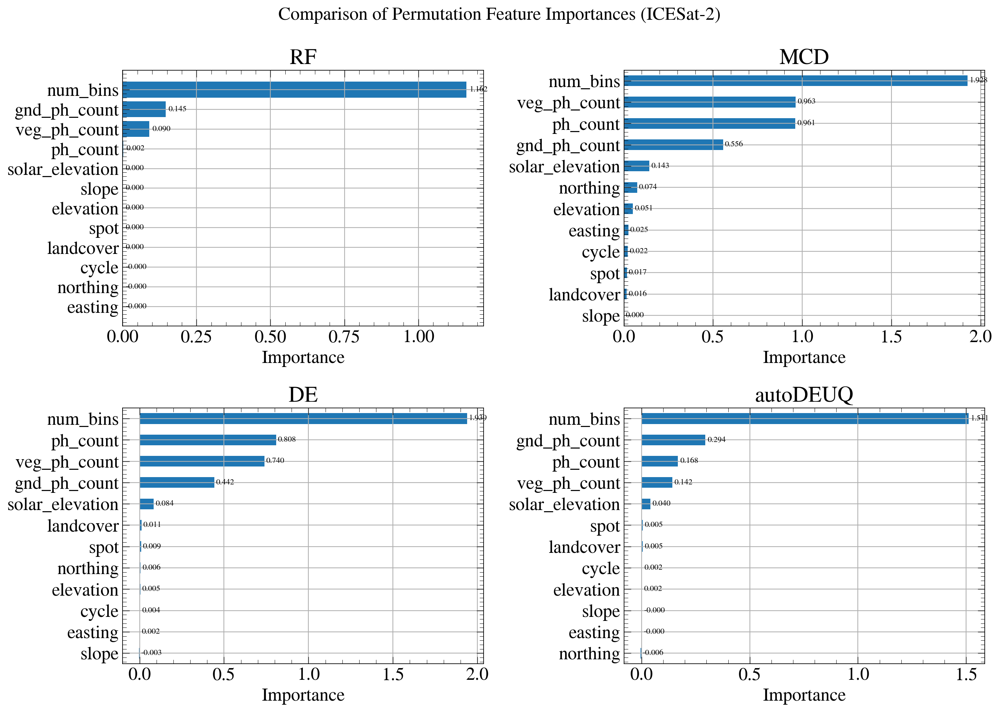

In [107]:
def annotate_bars(ax):
    """Annotate each bar in a horizontal bar plot."""
    for bar in ax.patches:
        width = bar.get_width()
        ax.text(width + 0.01, bar.get_y() + bar.get_height()/2,
                f'{width:.3f}', va='center', fontsize=8)

# subplot grid
fig, axs = plt.subplots(2, 2, figsize=(14, 10))
axs = axs.flatten()

# Random Forest
axs[0].barh(all_feature_names[sorted_idx], result.importances_mean[sorted_idx])
axs[0].set_title("RF")
# axs[0].set_title("Permutation Feature Importances (RF)")
axs[0].set_xlabel("Importance")
axs[0].grid(True)
annotate_bars(axs[0])

# Monte Carlo Dropout (MCD)
importance_mcd_series.sort_values().plot(kind='barh', ax=axs[1])
axs[1].set_title("MCD")
# axs[1].set_title("Permutation Importance (MCD)")
axs[1].set_xlabel("Importance")
axs[1].grid(True)
annotate_bars(axs[1])

# Deep Ensemble
importance_de_series.sort_values().plot(kind='barh', ax=axs[2])
axs[2].set_title("DE")
# axs[2].set_title("Permutation Importance (DE)")
axs[2].set_xlabel("Importance")
axs[2].grid(True)
annotate_bars(axs[2])

# autoDEUQ
importance_autodeuq_series.sort_values().plot(kind='barh', ax=axs[3])
axs[3].set_title("autoDEUQ")
# axs[3].set_title("Permutation Importance (autoDEUQ)")
axs[3].set_xlabel("Importance")
axs[3].grid(True)
annotate_bars(axs[3])

# super title
fig.suptitle("Comparison of Permutation Feature Importances (ICESat-2)", fontsize=18)

# layout
plt.tight_layout()
plt.show()

In [108]:
print("Done!!!")

Done!!!
